In [1]:
import numpy as np
import geopandas as gp
import shapely as sp
import matplotlib.pyplot as plt
import contextily as cx
import cartopy as cp
from datetime import datetime as dt
import datetime
from datetime import timedelta
import xarray as xr
import pandas as pd
import re
import os
import cartopy.crs as ccrs
import utils
from xmca.xarray import xMCA
from matplotlib.ticker import MaxNLocator
from utils_filter import *
from utils_datetime import *
from utils_plotting import *
from utils_geography import *
from utils_mca import *

## Read in Data
Data initially processed in load_data.ipynb. Utils also have a variety of functions

In [2]:
data_location = 'data'
moderate = True # only consider moderate days
outlooks, pph, reports = read_datasets(data_location, moderate)


reading outlooks
reading pph
reading storm reports


## Picking out a geographical region covering continental US
Not too important, since places outside US will be all zeros

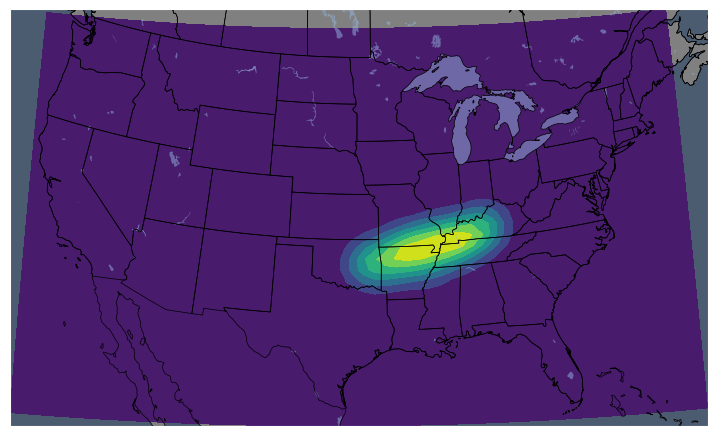

In [3]:
# select region containing all of US:

pph = pph.isel(time=(pph.time.dt.year > 2001))
pph = pph.isel(x=(pph.x > 19))
pph = pph.isel(x=(pph.x < 82))
pph = pph.isel(y=(pph.y > 9))
pph = pph.isel(y=(pph.y < 48))

#view window to make sure it's in a good spot
fig=plt.figure(figsize=(9,6))
plt.style.use('dark_background')
ax = plt.axes(projection = cp.crs.LambertConformal())
ax.add_feature(cp.feature.LAND,facecolor='grey')
ax.add_feature(cp.feature.OCEAN, alpha = 0.5)
ax.add_feature(cp.feature.COASTLINE,linewidth=0.5)
ax.add_feature(cp.feature.LAKES, alpha = 0.5)
ax.add_feature(cp.feature.STATES,linewidth=0.5)
plt.contourf(pph.lon.values, pph.lat.values, pph['p_perfect_wind'].values[0, :, :], transform=cp.crs.PlateCarree())

## Create grid-wise outlook dataset
and save it for later use

In [ ]:
hazards = ['wind', 'hail', 'tor'] # hazards well look at
save_location = 'matricies/outlooks_real_updated.nc'

create_gridded_outlook_dataset(outlooks, pph, hazards, save_location)

## Open up the outlooks dataset that we just saved 
(so we can pick up where we left off if needed)

In [4]:
outlook_dataset = xr.open_dataset('matricies/outlooks_real_updated.nc')


In [5]:
hazards = ['wind', 'hail', 'tor']
# changing names of coords for xMCA
outlook_dataset_renamed = outlook_dataset.drop_vars(['lat', 'lon'])
outlook_dataset_renamed = outlook_dataset_renamed.rename({'x':'lon', 'y':'lat'})
pph_renamed = pph.drop_vars(['lat', 'lon'])
pph_renamed = pph_renamed.rename({'x':'lon', 'y':'lat'})
pph_renamed = pph_renamed / 100

## Do MCA and Plot all sorts of Results

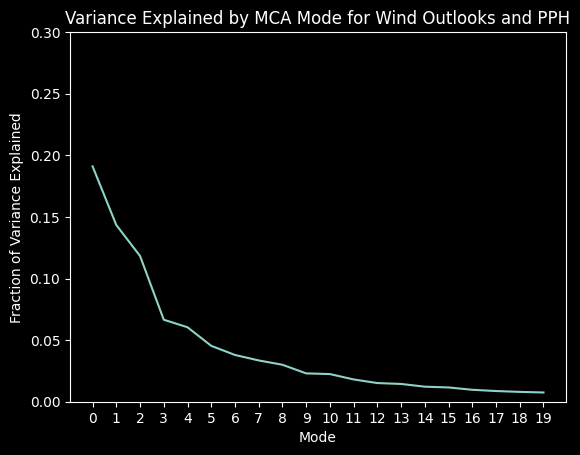

<Figure size 640x480 with 0 Axes>

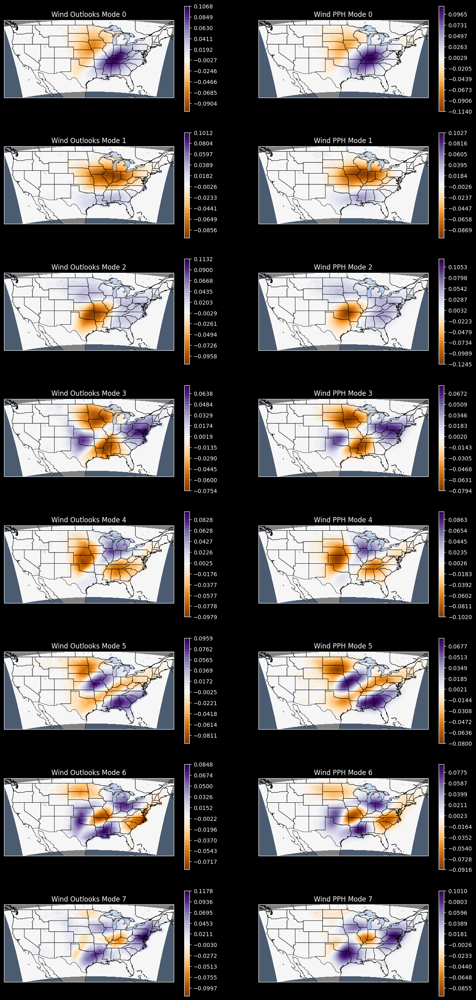

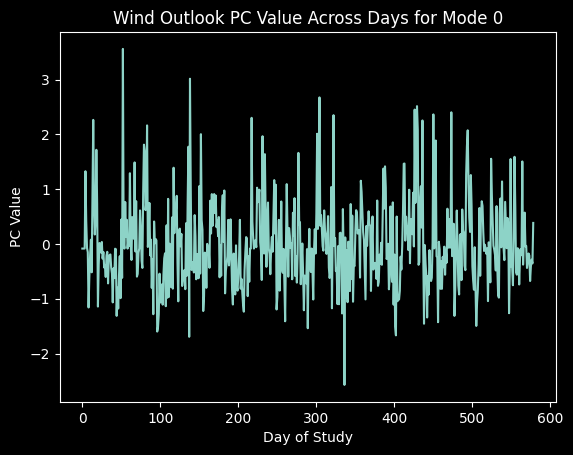

<Figure size 640x480 with 0 Axes>

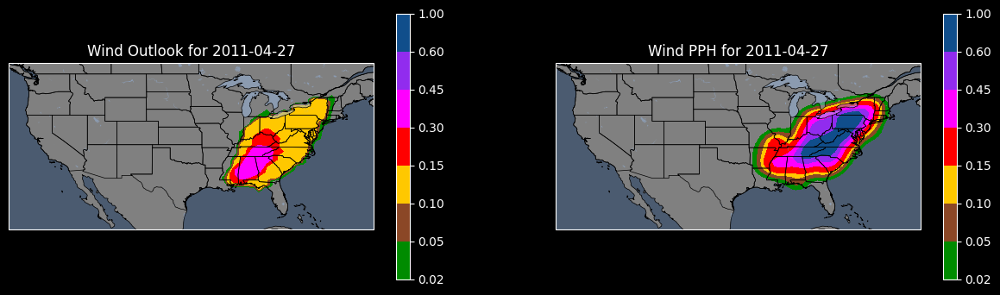

<Figure size 640x480 with 0 Axes>

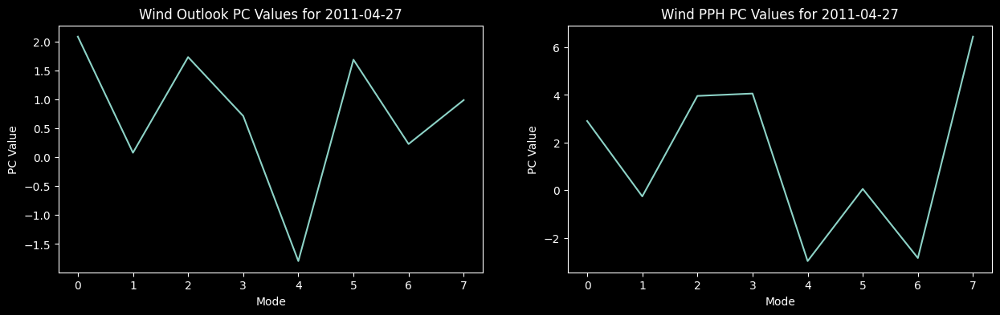

Day Maximixing Outlooks PC 0, 2002-11-10T12:00:00


<Figure size 640x480 with 0 Axes>

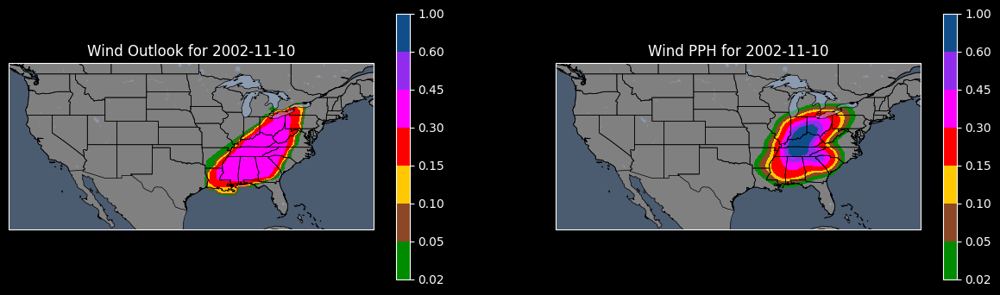

<Figure size 640x480 with 0 Axes>

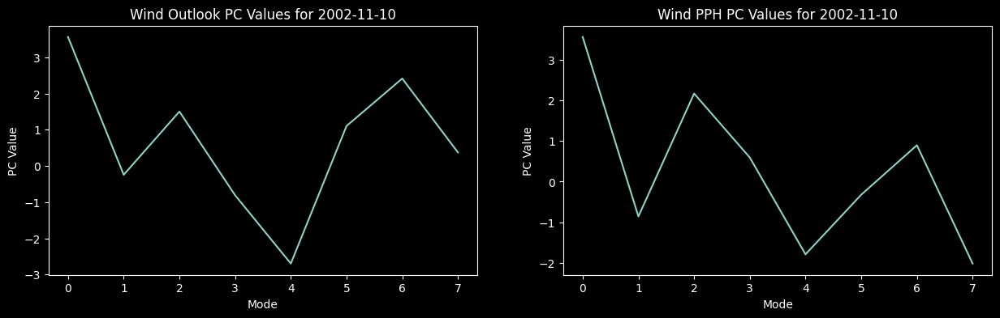

Day Minimizing Outlooks PC 0, 2008-06-05T12:00:00


<Figure size 640x480 with 0 Axes>

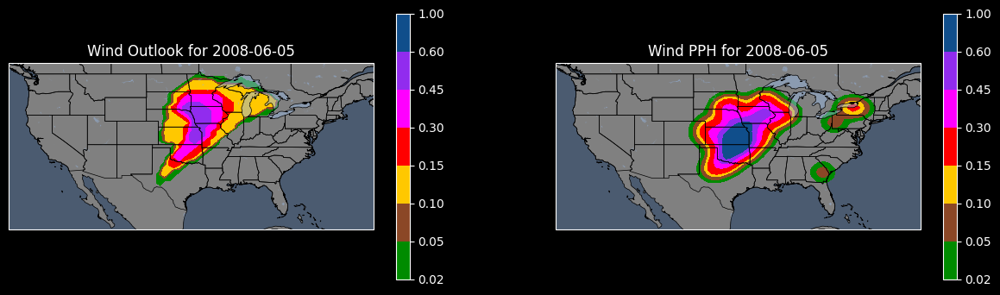

<Figure size 640x480 with 0 Axes>

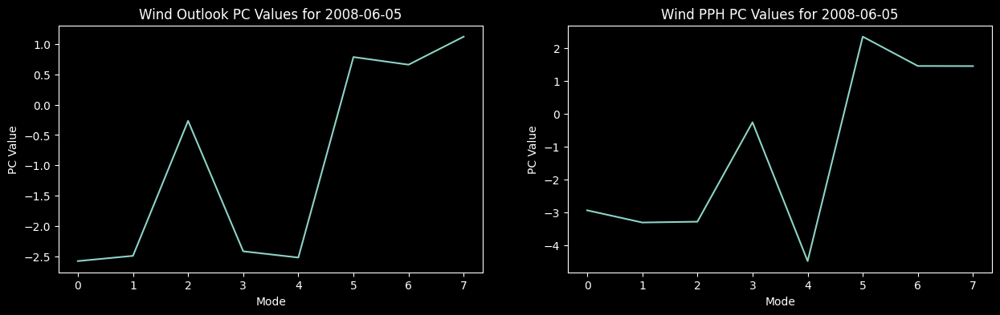

Day Maximixing Outlooks PC 1, 2003-02-21T12:00:00


<Figure size 640x480 with 0 Axes>

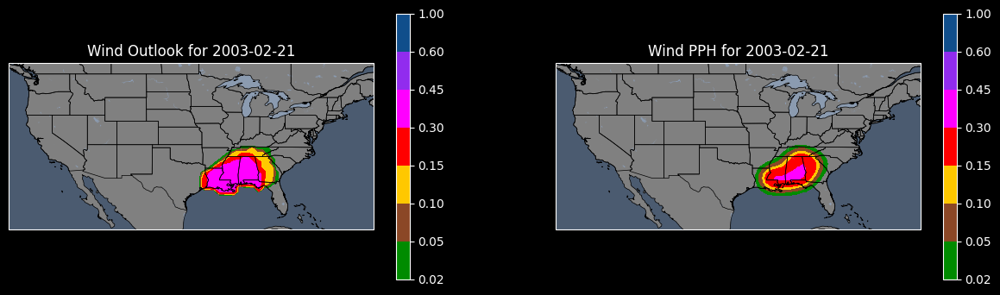

<Figure size 640x480 with 0 Axes>

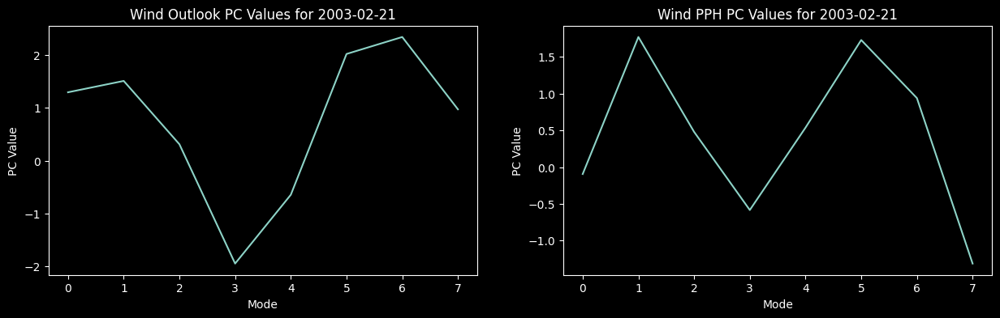

Day Minimizing Outlooks PC 1, 2008-06-03T12:00:00


<Figure size 640x480 with 0 Axes>

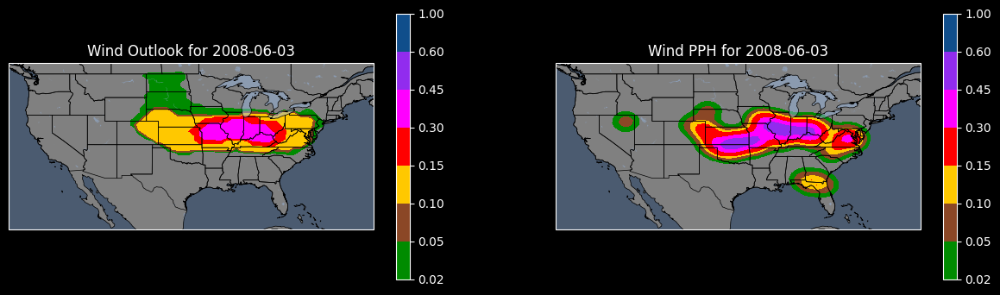

<Figure size 640x480 with 0 Axes>

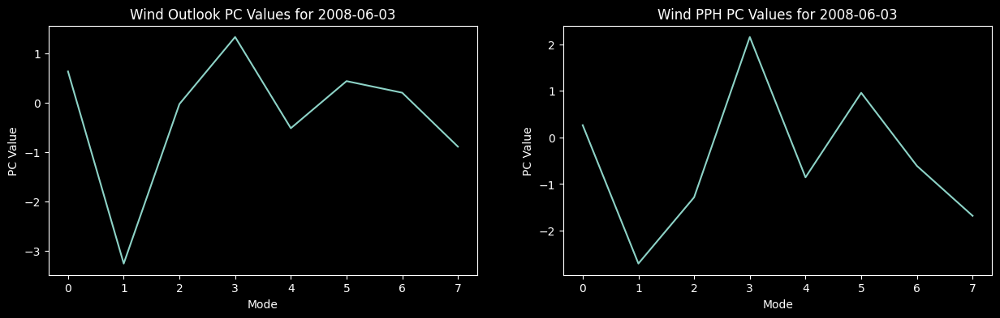

Day Maximixing Outlooks PC 2, 2003-07-06T12:00:00


<Figure size 640x480 with 0 Axes>

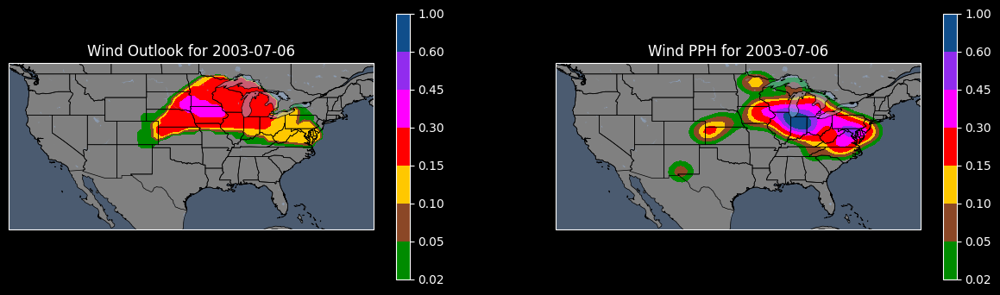

<Figure size 640x480 with 0 Axes>

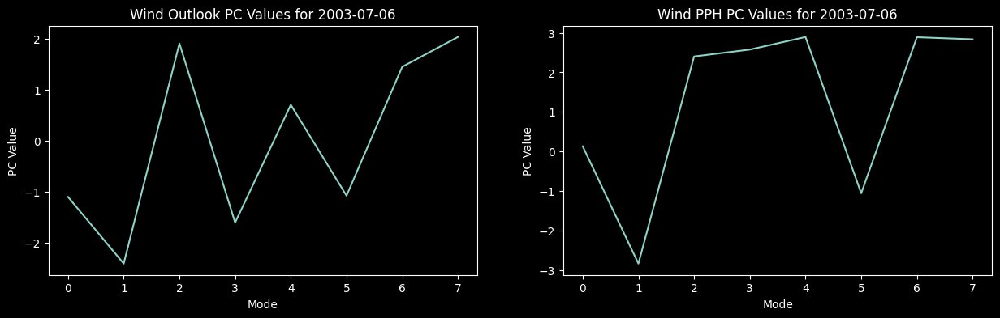

Day Minimizing Outlooks PC 2, 2009-02-10T12:00:00


<Figure size 640x480 with 0 Axes>

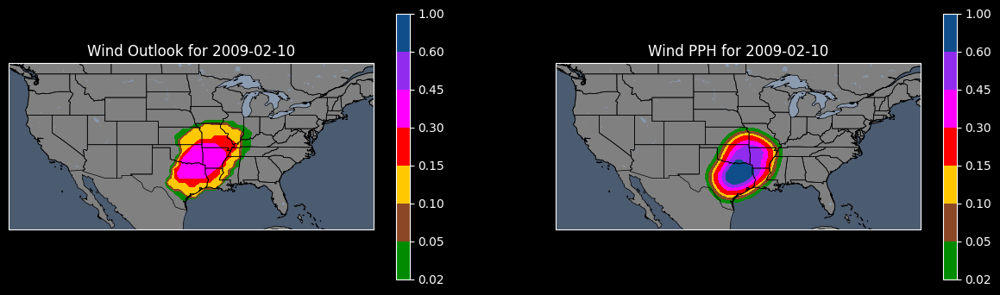

<Figure size 640x480 with 0 Axes>

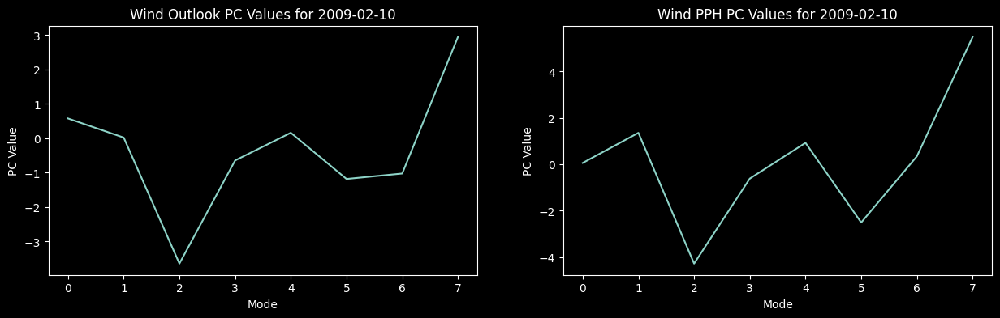

Day Maximixing Outlooks PC 3, 2004-06-14T12:00:00


<Figure size 640x480 with 0 Axes>

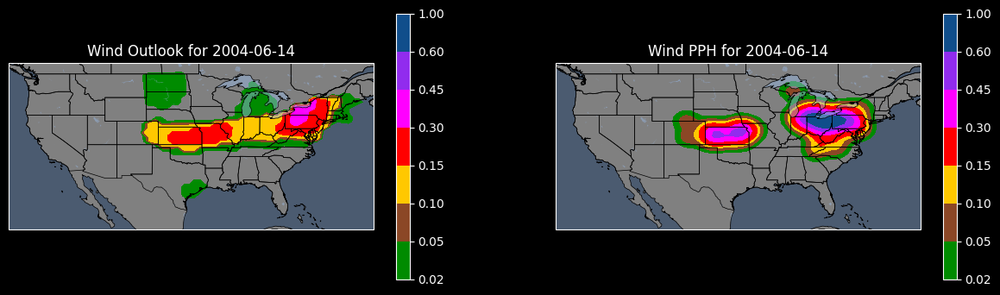

<Figure size 640x480 with 0 Axes>

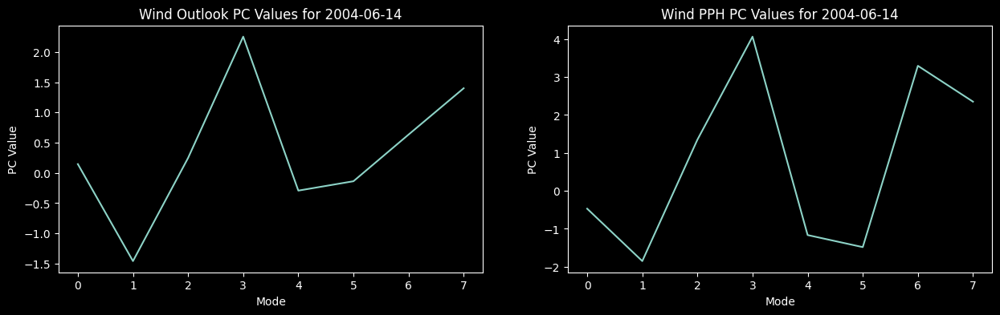

Day Minimizing Outlooks PC 3, 2008-05-10T12:00:00


<Figure size 640x480 with 0 Axes>

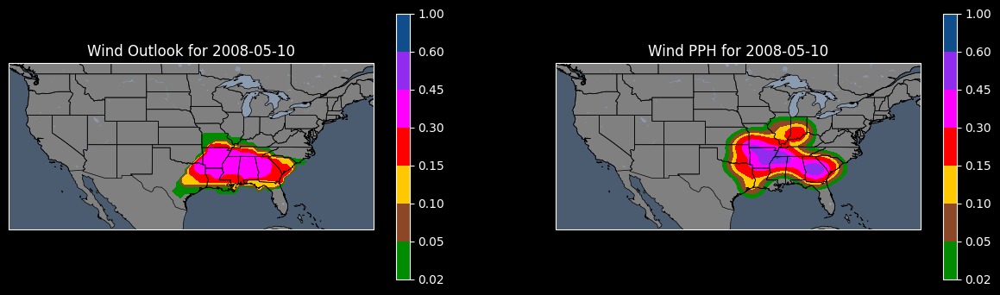

<Figure size 640x480 with 0 Axes>

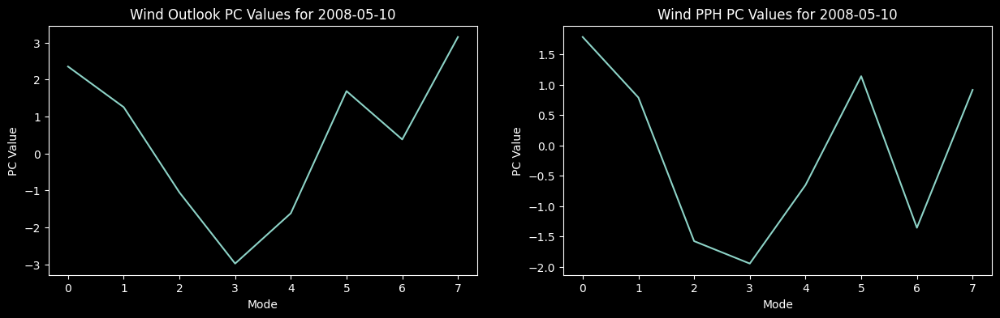

Day Maximixing Outlooks PC 4, 2007-06-07T12:00:00


<Figure size 640x480 with 0 Axes>

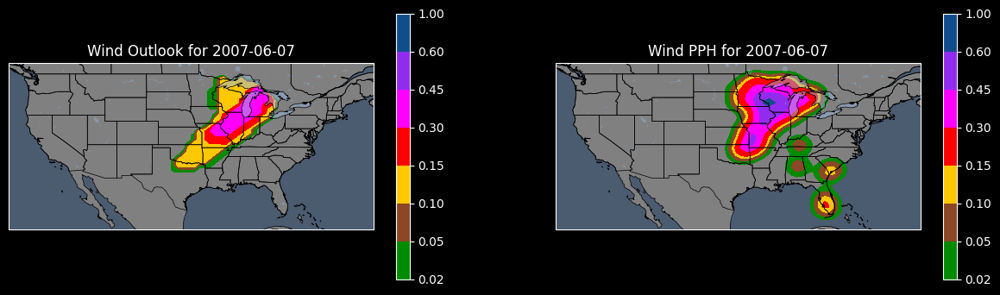

<Figure size 640x480 with 0 Axes>

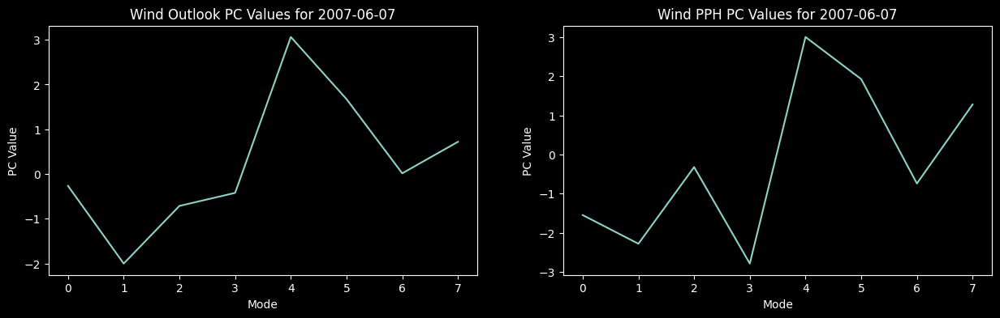

Day Minimizing Outlooks PC 4, 2009-06-15T12:00:00


<Figure size 640x480 with 0 Axes>

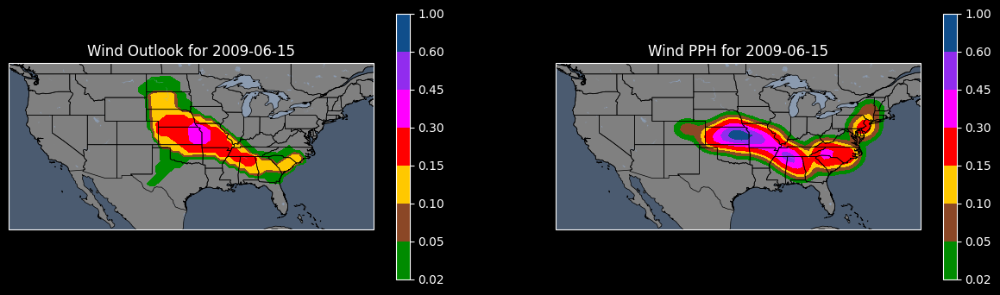

<Figure size 640x480 with 0 Axes>

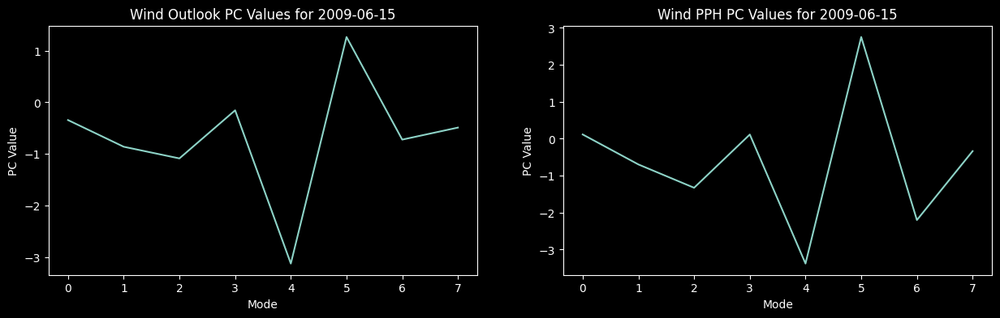

Day Maximixing Outlooks PC 5, 2007-03-01T12:00:00


<Figure size 640x480 with 0 Axes>

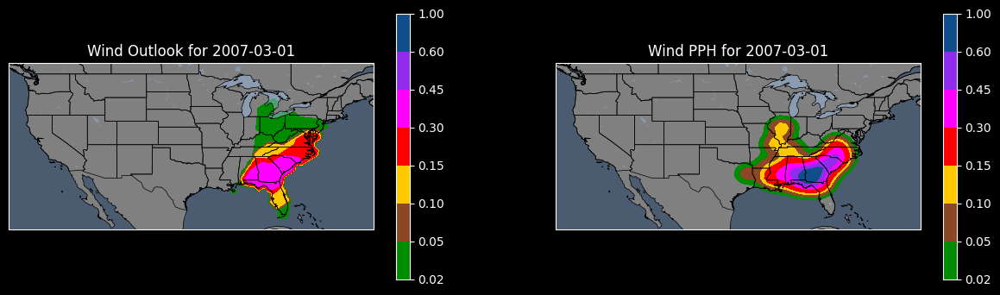

<Figure size 640x480 with 0 Axes>

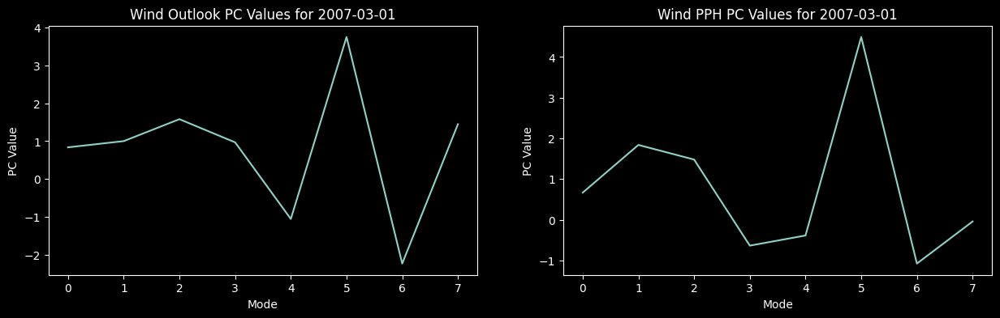

Day Minimizing Outlooks PC 5, 2007-06-06T12:00:00


<Figure size 640x480 with 0 Axes>

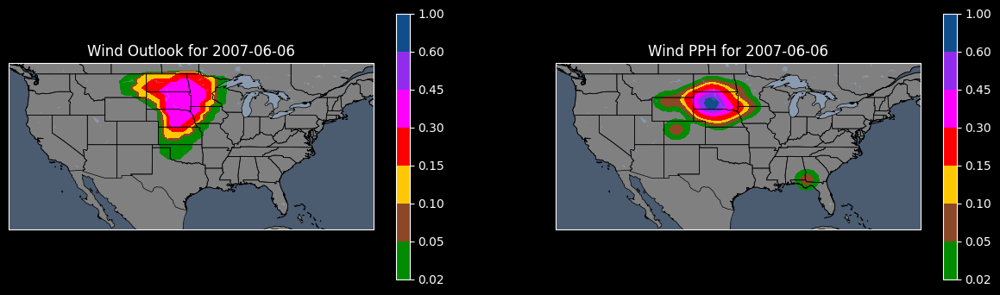

<Figure size 640x480 with 0 Axes>

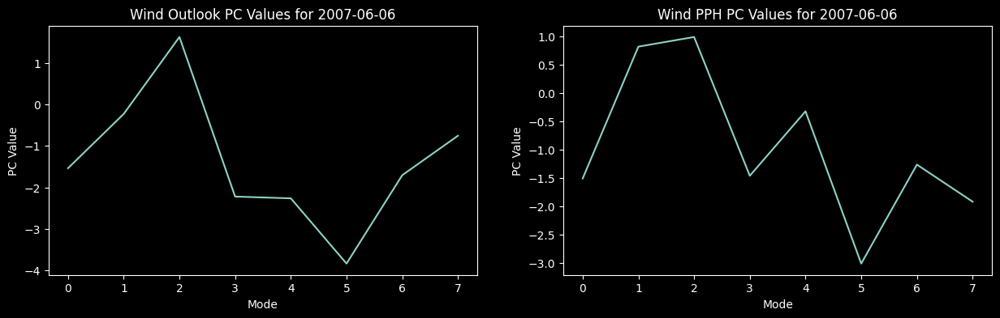

Day Maximixing Outlooks PC 6, 2006-06-21T12:00:00


<Figure size 640x480 with 0 Axes>

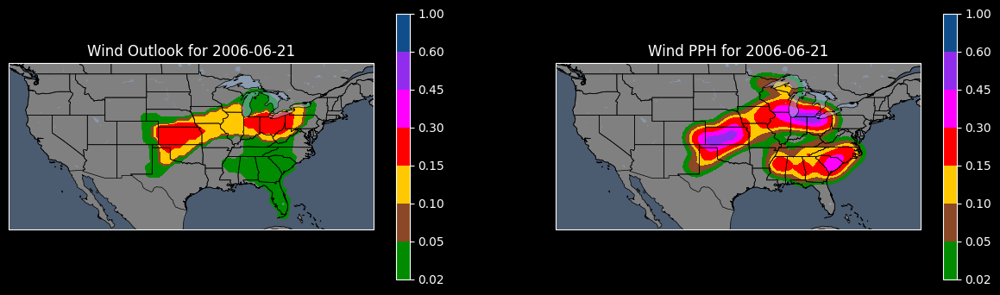

<Figure size 640x480 with 0 Axes>

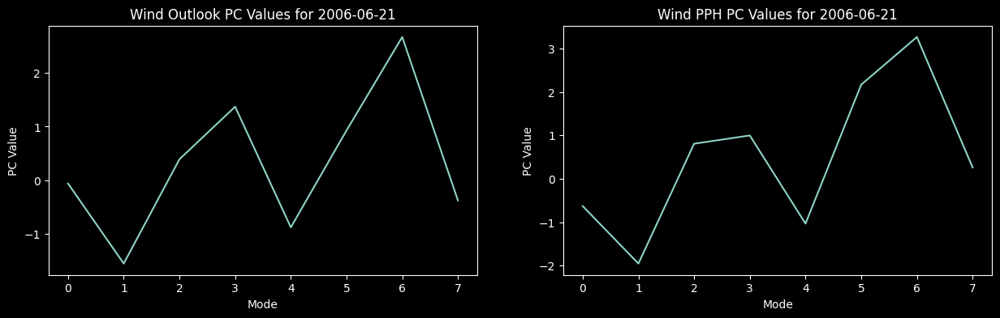

Day Minimizing Outlooks PC 6, 2008-03-04T12:00:00


<Figure size 640x480 with 0 Axes>

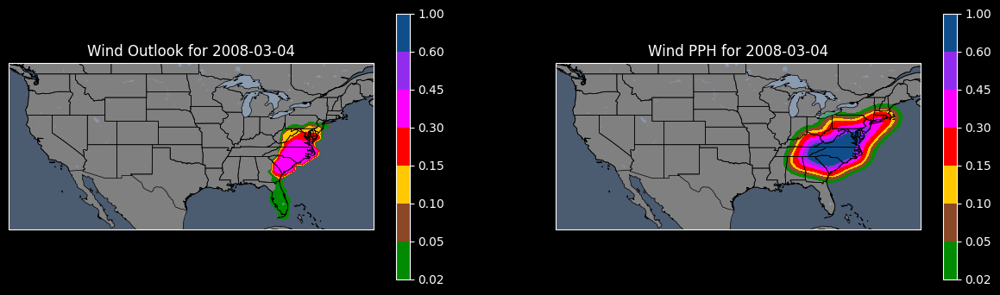

<Figure size 640x480 with 0 Axes>

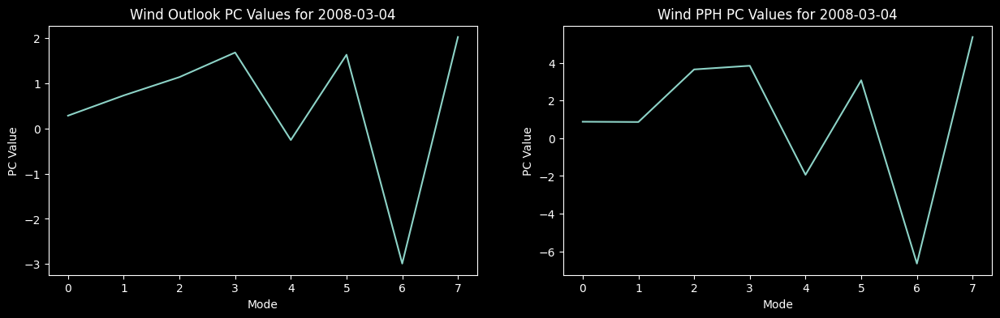

Day Maximixing Outlooks PC 7, 2008-05-10T12:00:00


<Figure size 640x480 with 0 Axes>

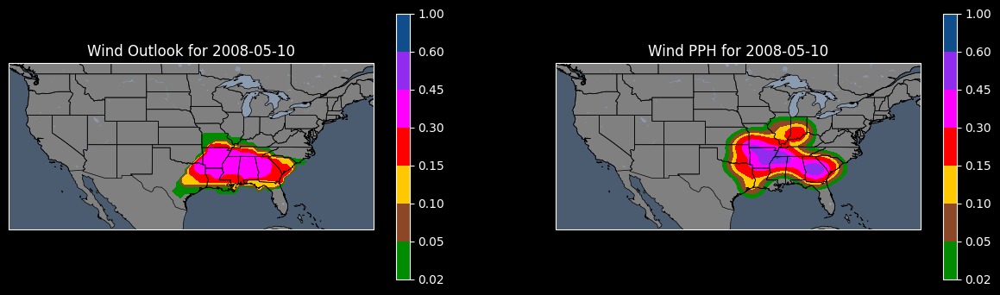

<Figure size 640x480 with 0 Axes>

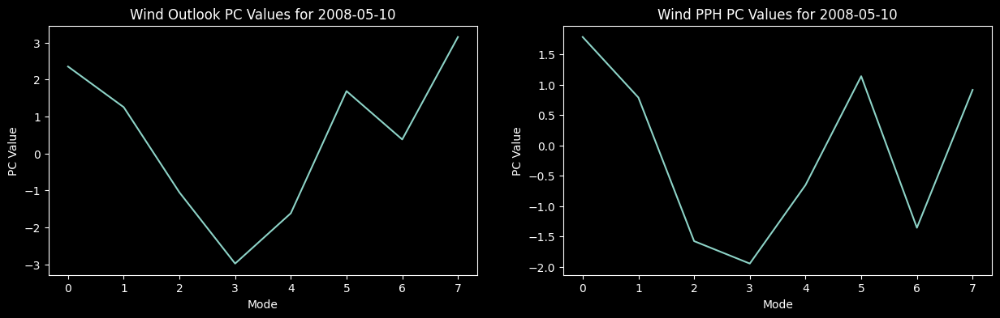

Day Minimizing Outlooks PC 7, 2002-04-27T12:00:00


<Figure size 640x480 with 0 Axes>

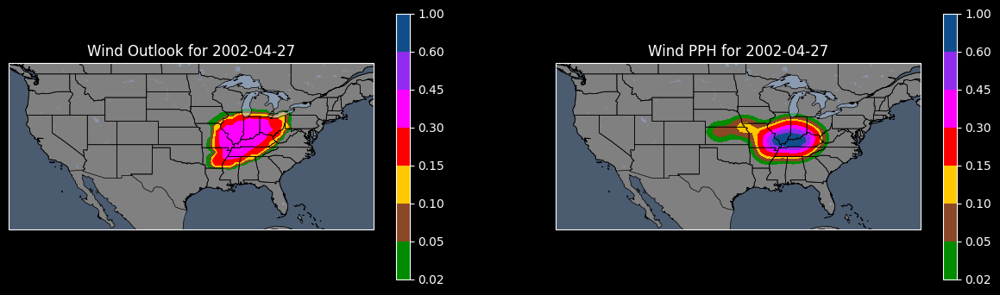

<Figure size 640x480 with 0 Axes>

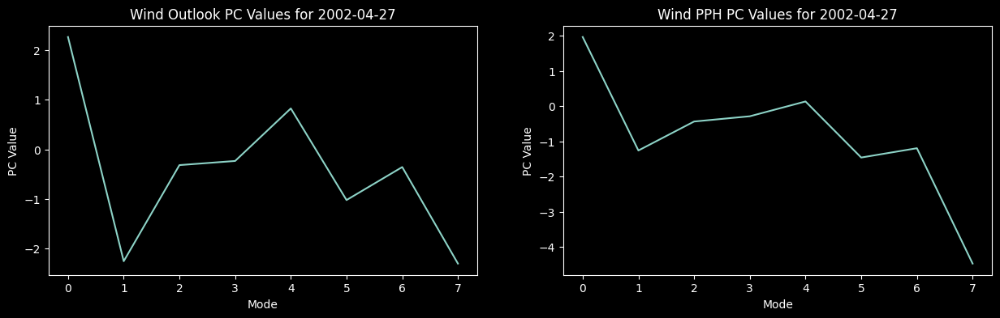

C:\Users\miles\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\miles\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


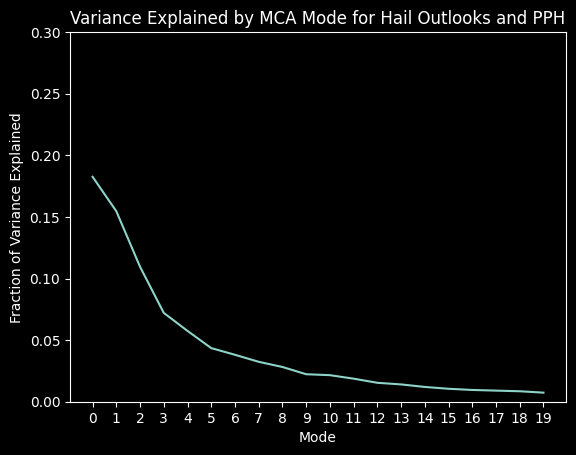

<Figure size 640x480 with 0 Axes>

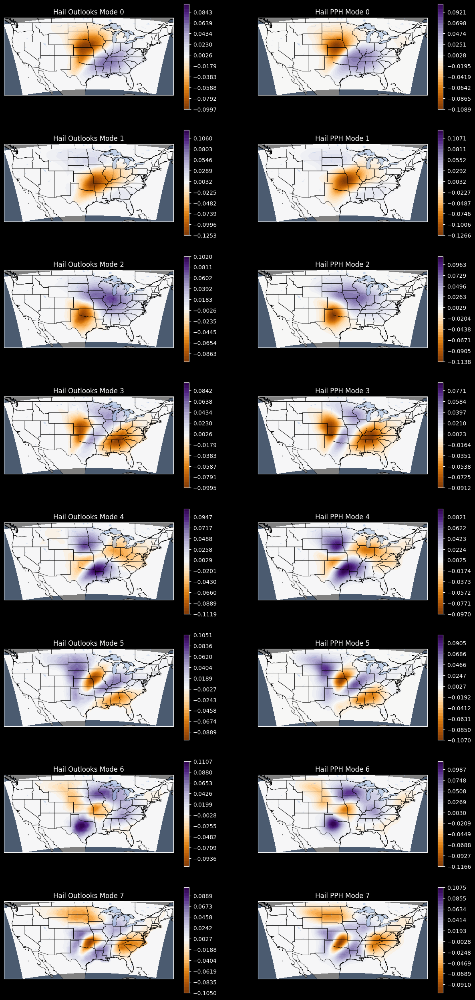

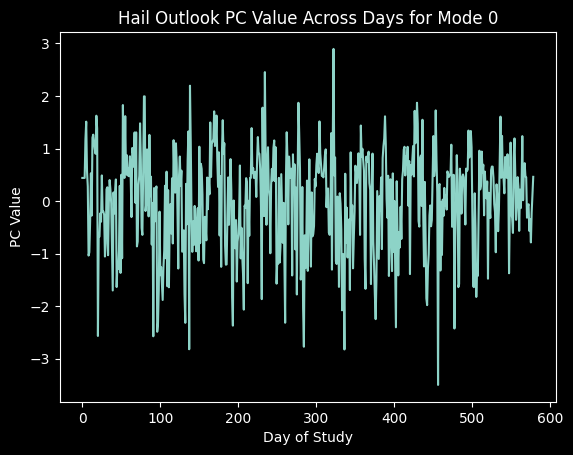

<Figure size 640x480 with 0 Axes>

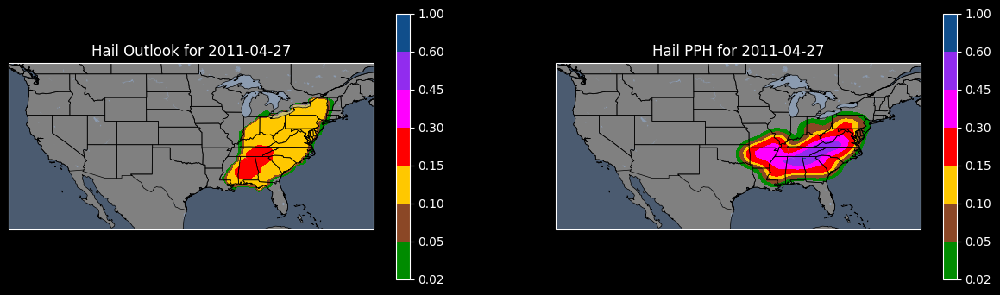

<Figure size 640x480 with 0 Axes>

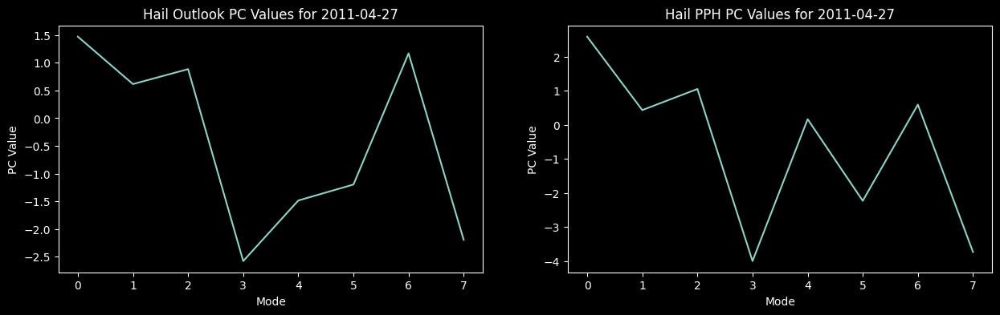

Day Maximixing Outlooks PC 0, 2008-05-10T12:00:00


<Figure size 640x480 with 0 Axes>

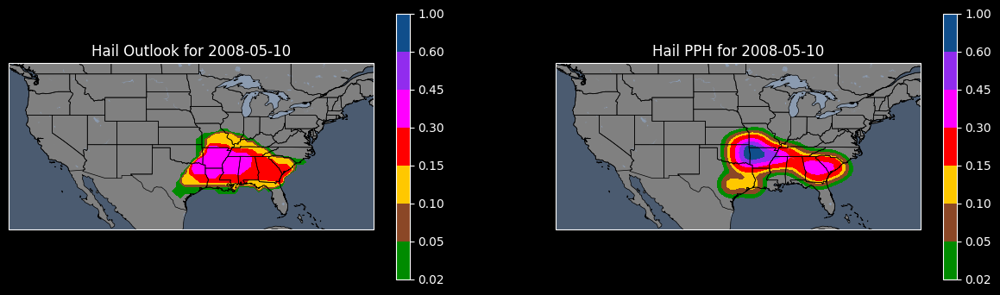

<Figure size 640x480 with 0 Axes>

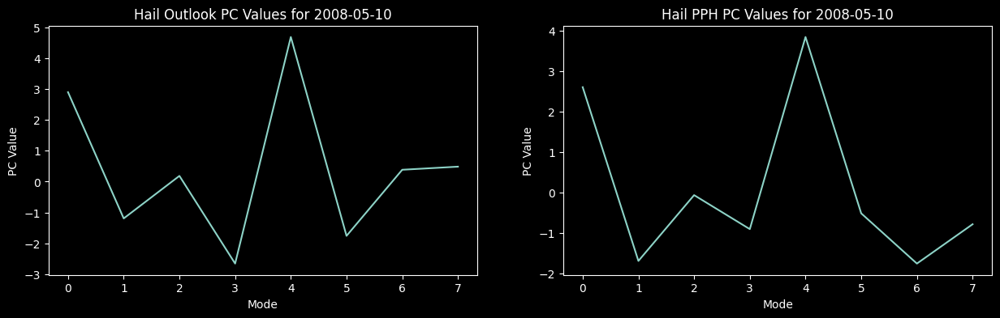

Day Minimizing Outlooks PC 0, 2012-04-14T12:00:00


<Figure size 640x480 with 0 Axes>

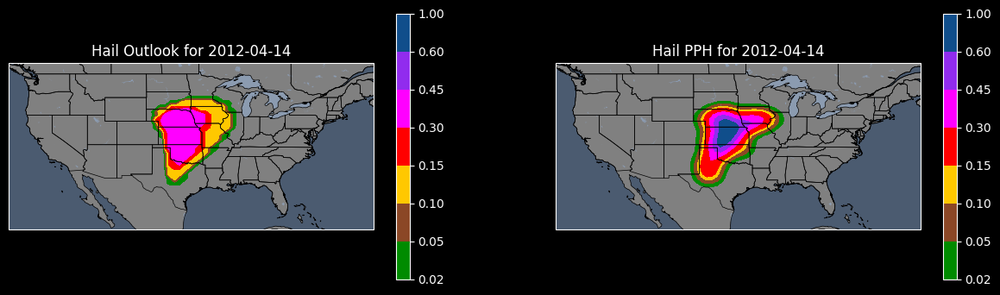

<Figure size 640x480 with 0 Axes>

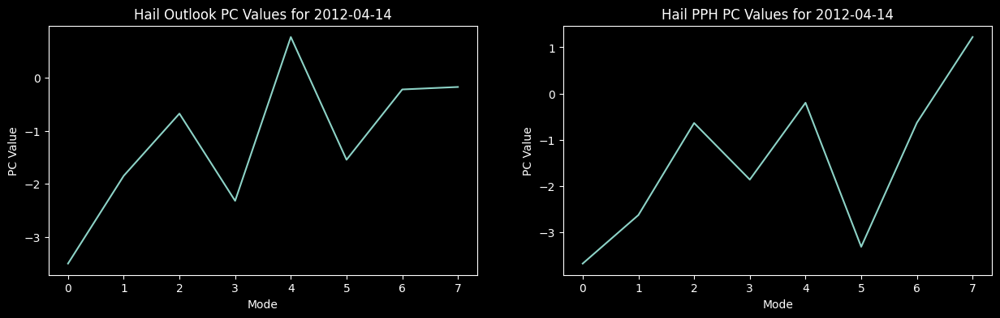

Day Maximixing Outlooks PC 1, 2007-06-16T12:00:00


<Figure size 640x480 with 0 Axes>

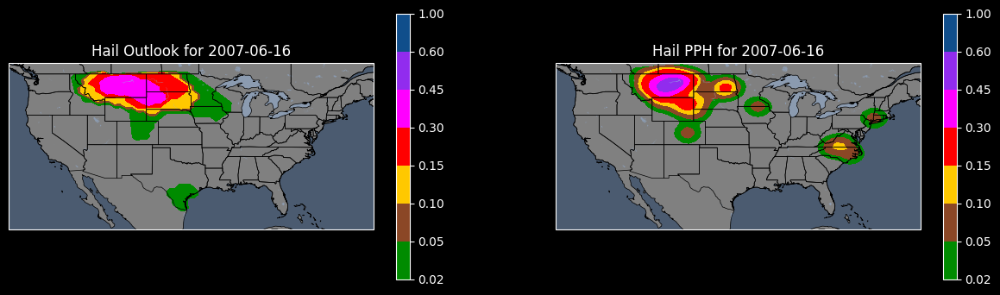

<Figure size 640x480 with 0 Axes>

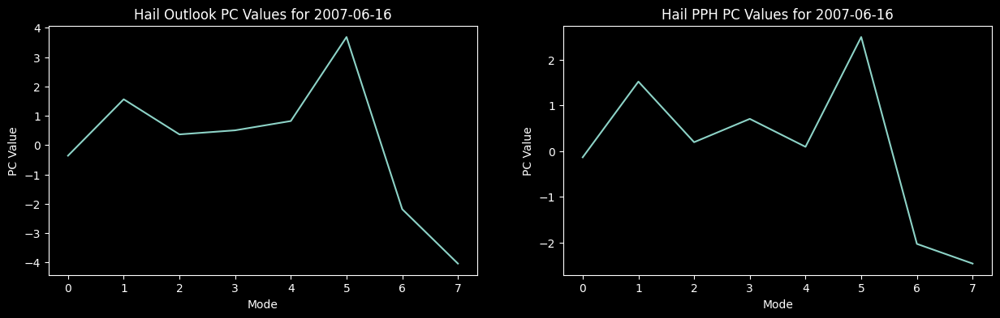

Day Minimizing Outlooks PC 1, 2006-03-12T12:00:00


<Figure size 640x480 with 0 Axes>

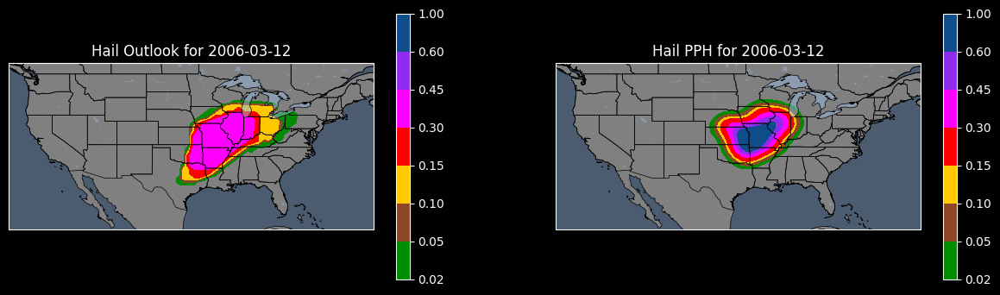

<Figure size 640x480 with 0 Axes>

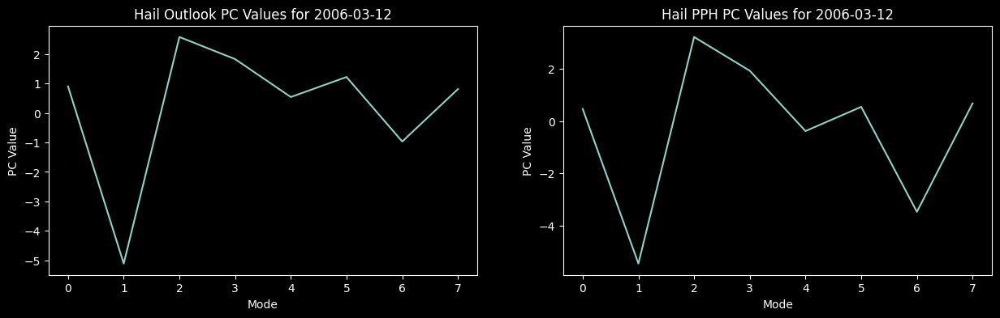

Day Maximixing Outlooks PC 2, 2002-04-27T12:00:00


<Figure size 640x480 with 0 Axes>

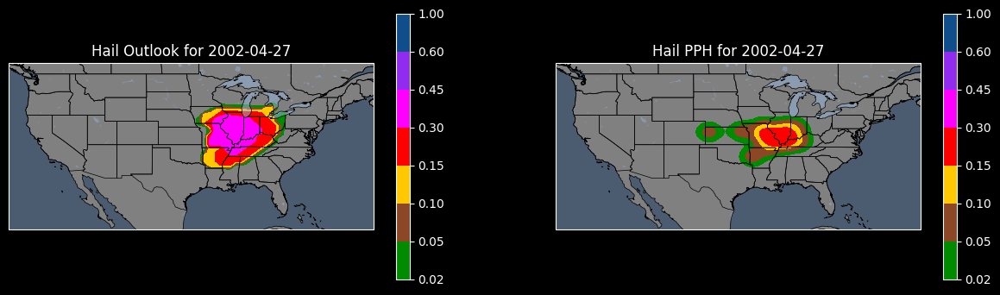

<Figure size 640x480 with 0 Axes>

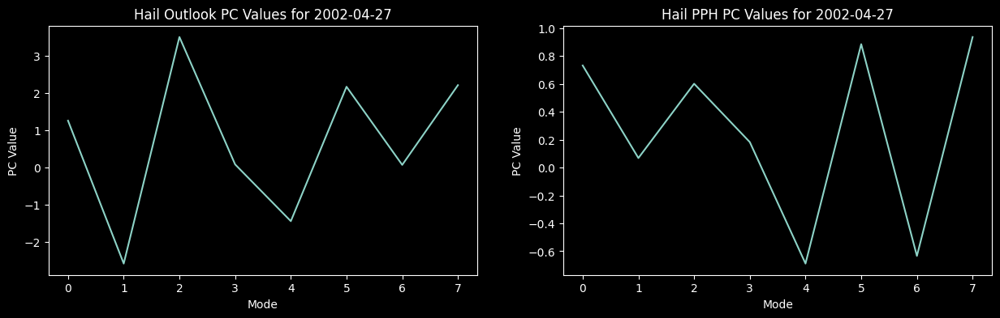

Day Minimizing Outlooks PC 2, 2008-04-09T12:00:00


<Figure size 640x480 with 0 Axes>

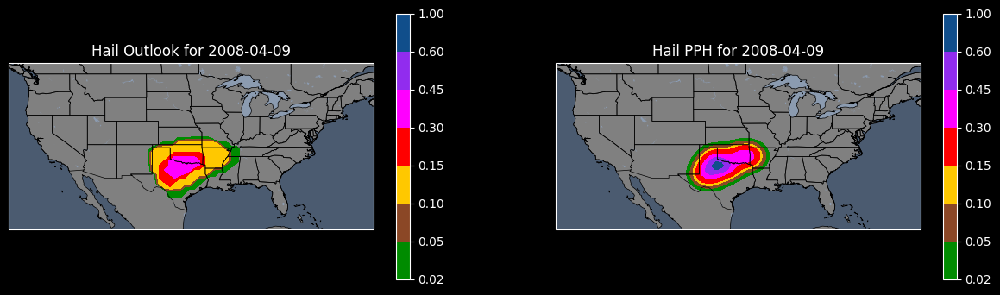

<Figure size 640x480 with 0 Axes>

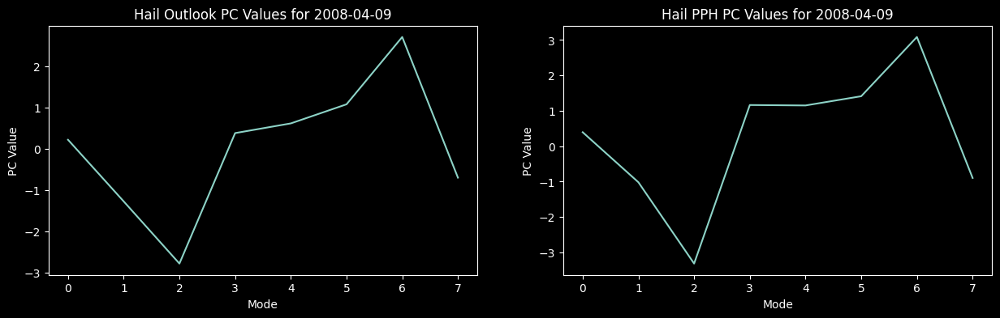

Day Maximixing Outlooks PC 3, 2007-06-07T12:00:00


<Figure size 640x480 with 0 Axes>

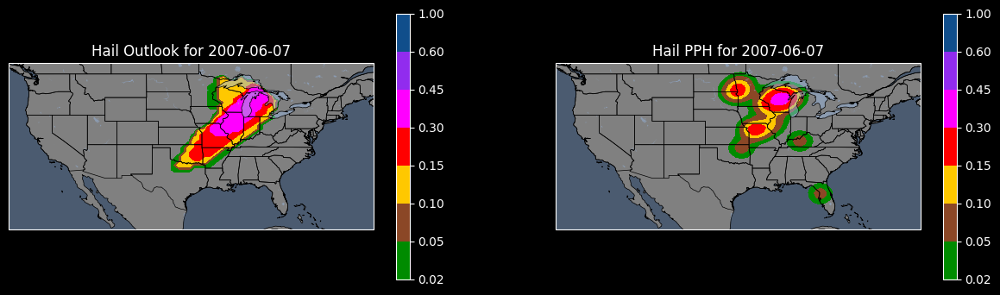

<Figure size 640x480 with 0 Axes>

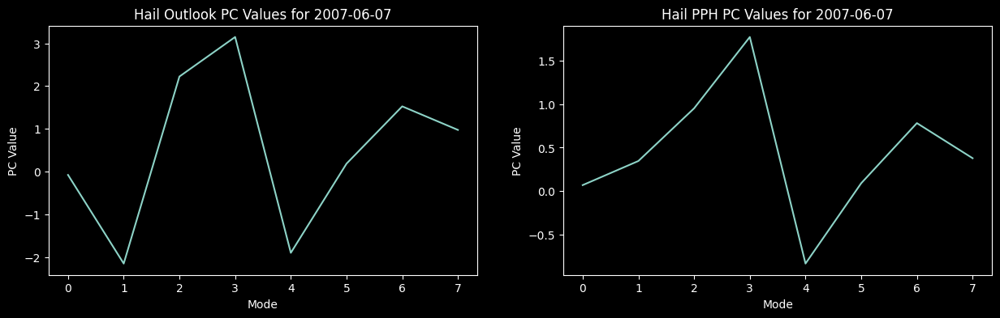

Day Minimizing Outlooks PC 3, 2006-04-07T12:00:00


<Figure size 640x480 with 0 Axes>

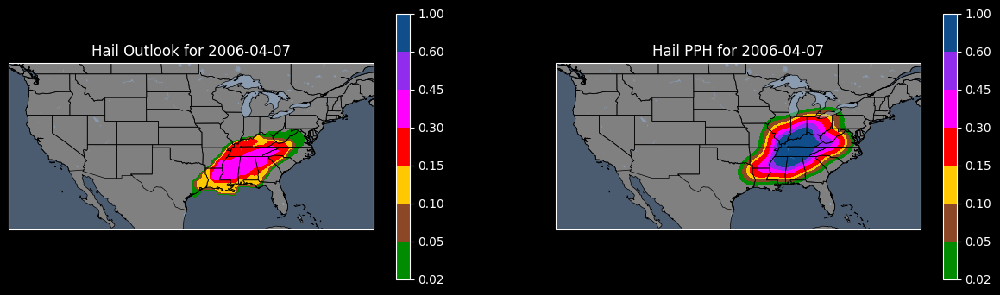

<Figure size 640x480 with 0 Axes>

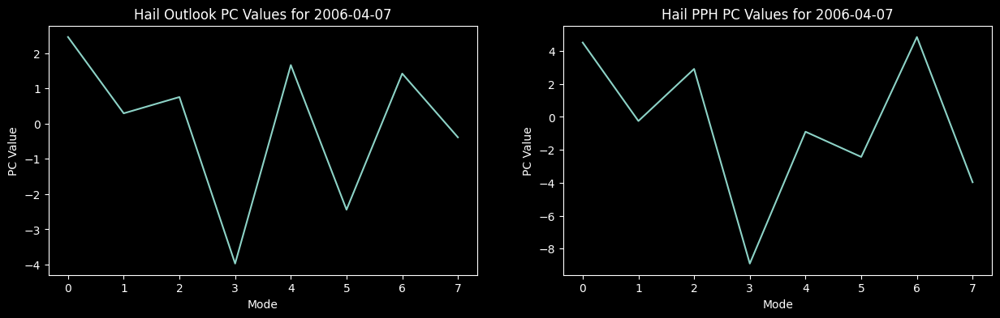

Day Maximixing Outlooks PC 4, 2008-05-10T12:00:00


<Figure size 640x480 with 0 Axes>

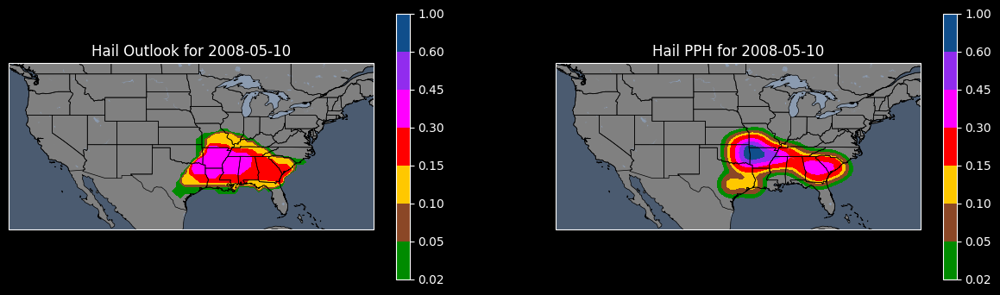

<Figure size 640x480 with 0 Axes>

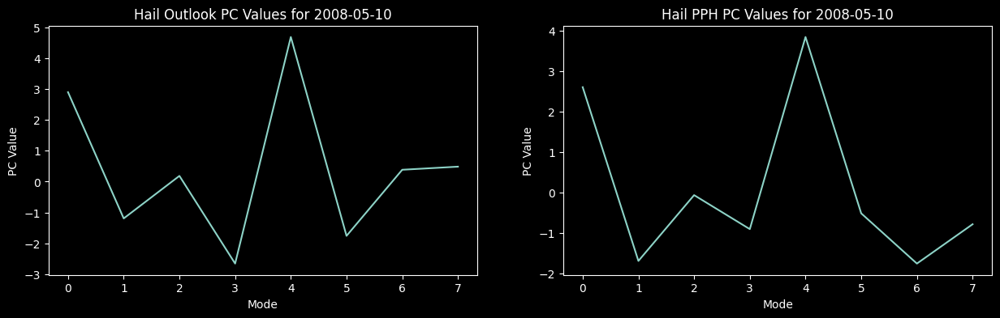

Day Minimizing Outlooks PC 4, 2003-05-09T12:00:00


<Figure size 640x480 with 0 Axes>

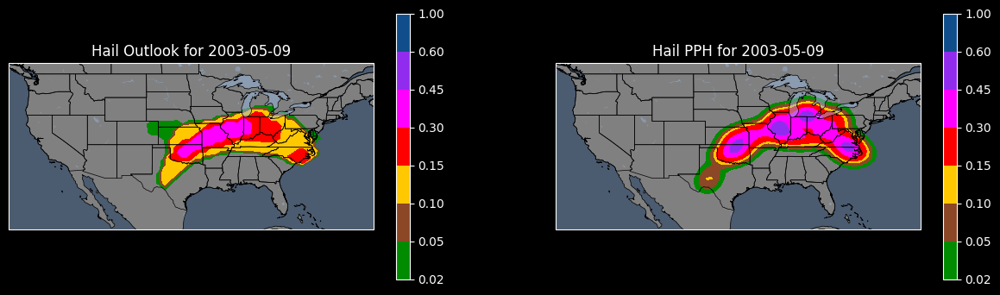

<Figure size 640x480 with 0 Axes>

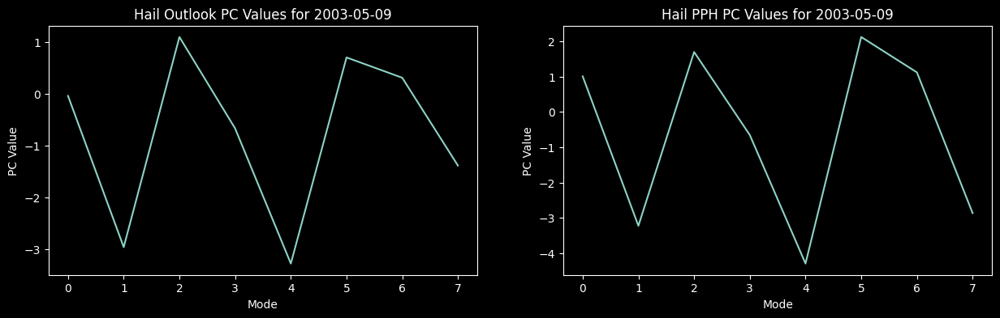

Day Maximixing Outlooks PC 5, 2007-06-16T12:00:00


<Figure size 640x480 with 0 Axes>

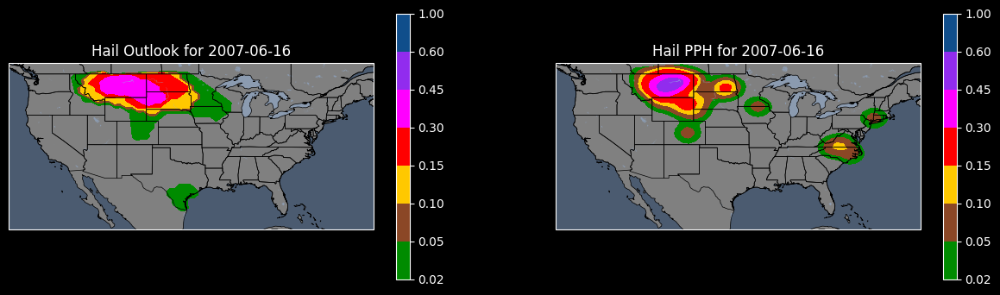

<Figure size 640x480 with 0 Axes>

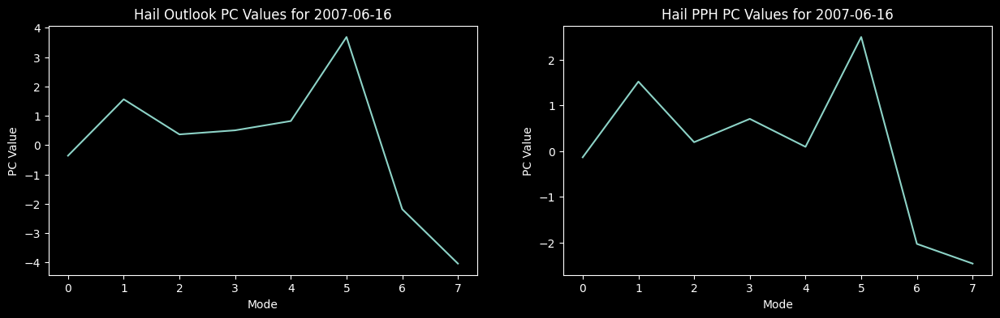

Day Minimizing Outlooks PC 5, 2005-06-04T12:00:00


<Figure size 640x480 with 0 Axes>

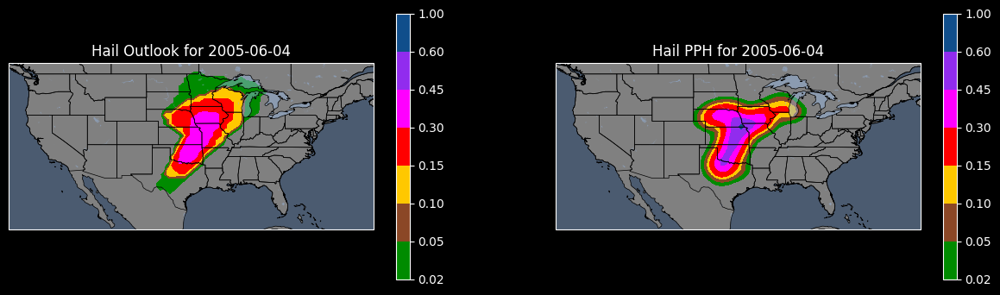

<Figure size 640x480 with 0 Axes>

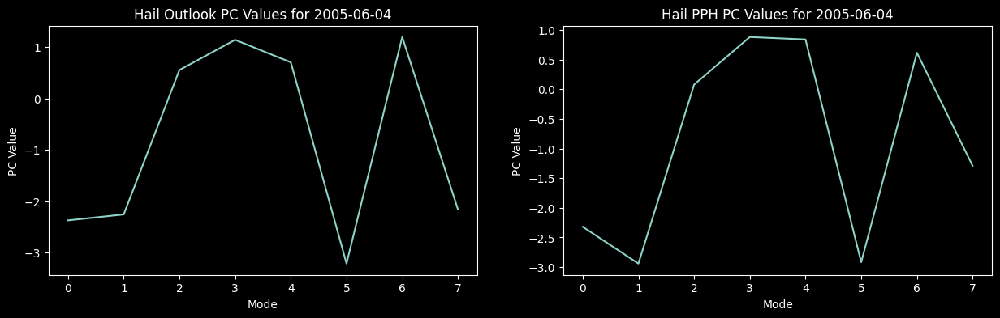

Day Maximixing Outlooks PC 6, 2003-07-06T12:00:00


<Figure size 640x480 with 0 Axes>

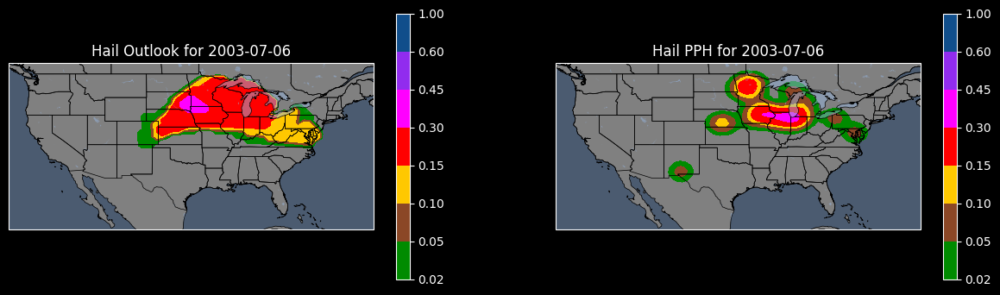

<Figure size 640x480 with 0 Axes>

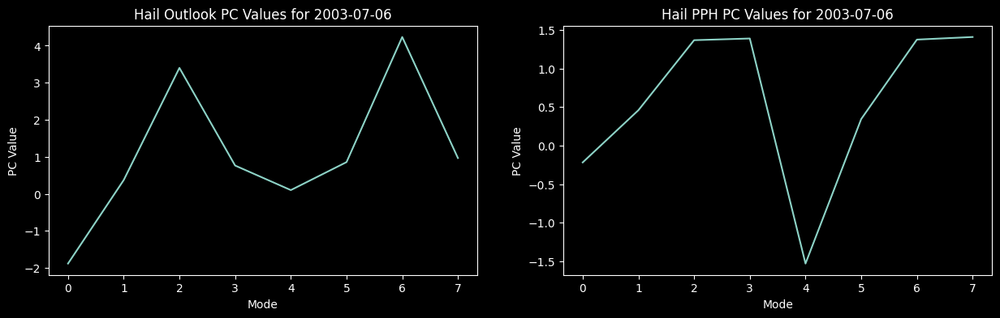

Day Minimizing Outlooks PC 6, 2007-02-28T12:00:00


<Figure size 640x480 with 0 Axes>

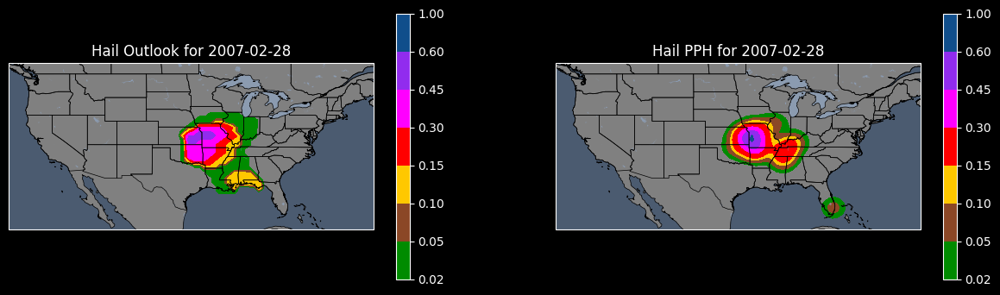

<Figure size 640x480 with 0 Axes>

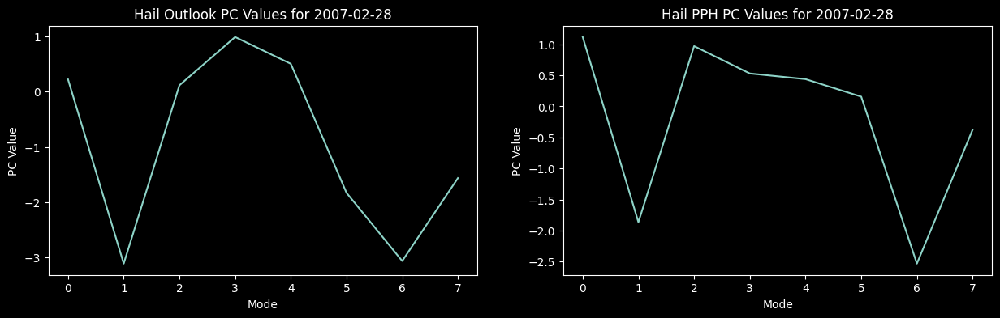

Day Maximixing Outlooks PC 7, 2004-11-23T12:00:00


<Figure size 640x480 with 0 Axes>

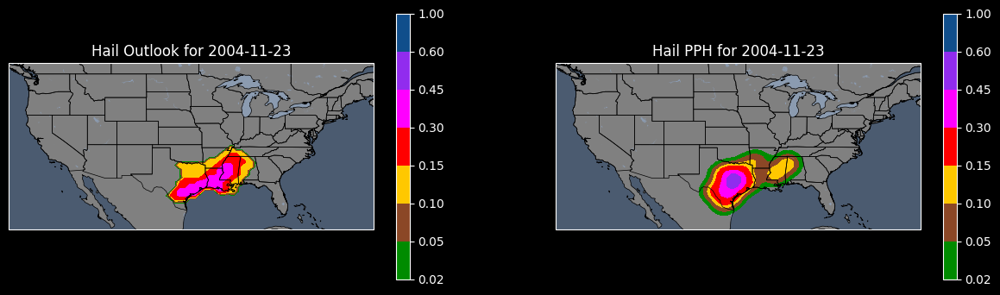

<Figure size 640x480 with 0 Axes>

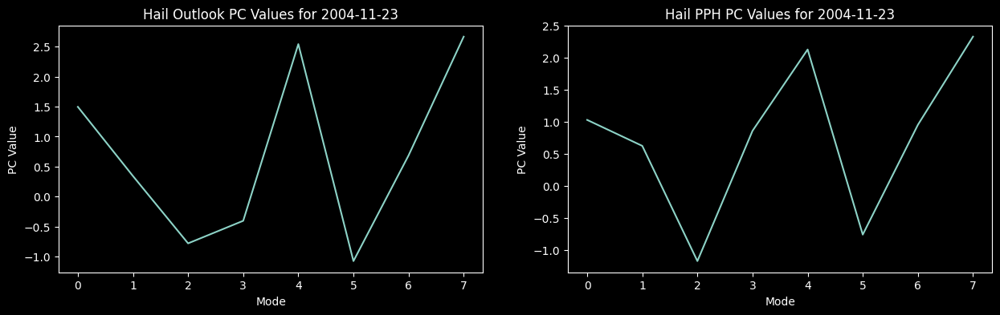

Day Minimizing Outlooks PC 7, 2007-06-16T12:00:00


<Figure size 640x480 with 0 Axes>

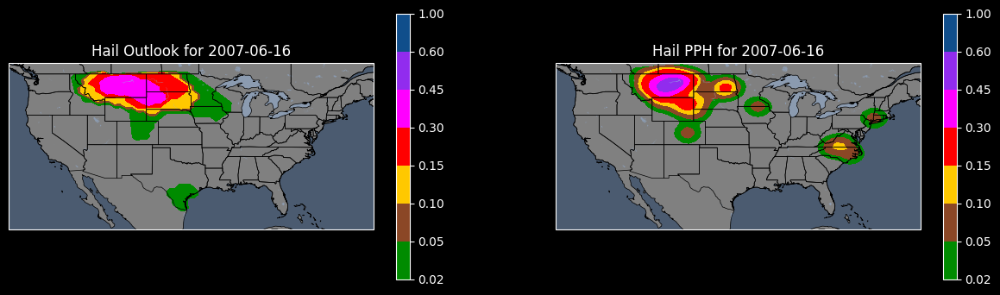

<Figure size 640x480 with 0 Axes>

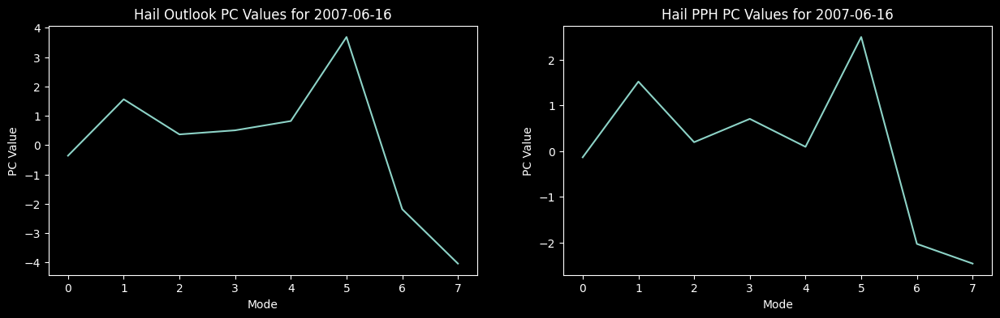

C:\Users\miles\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\miles\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


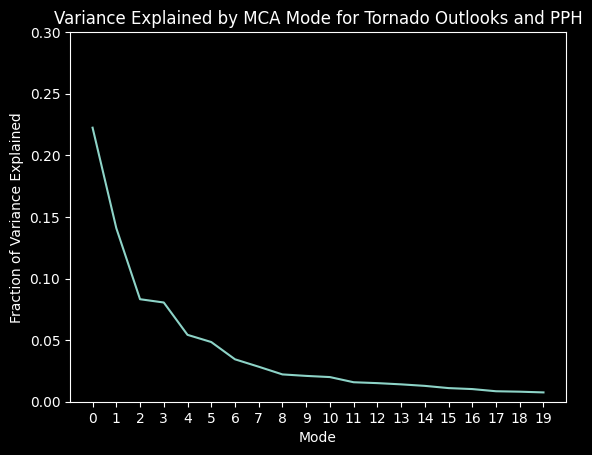

<Figure size 640x480 with 0 Axes>

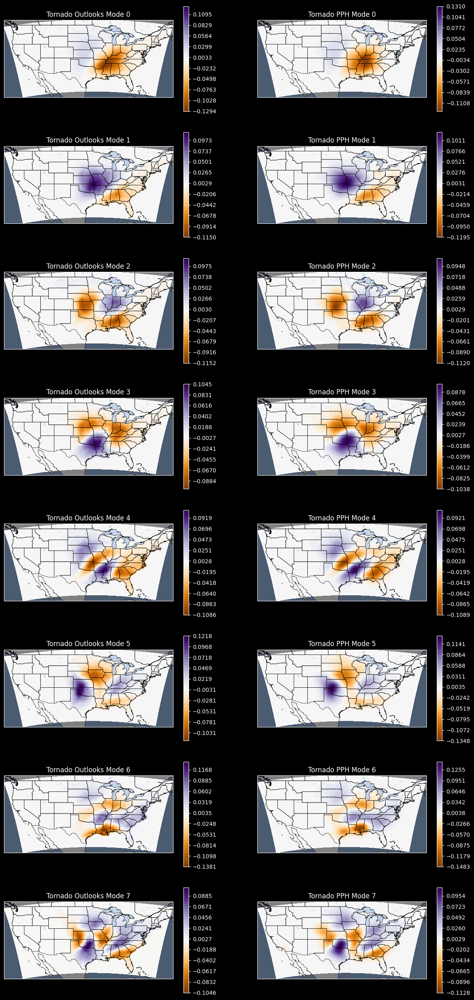

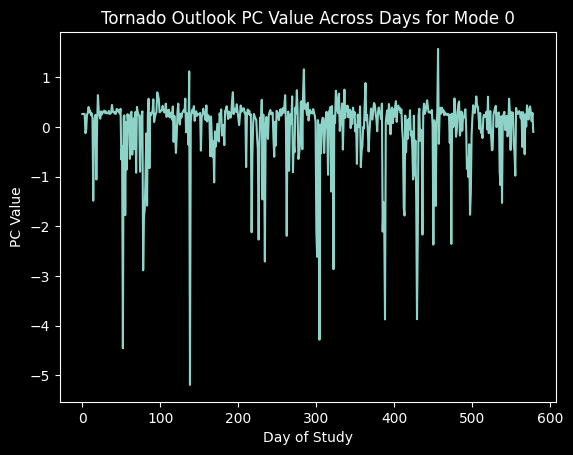

<Figure size 640x480 with 0 Axes>

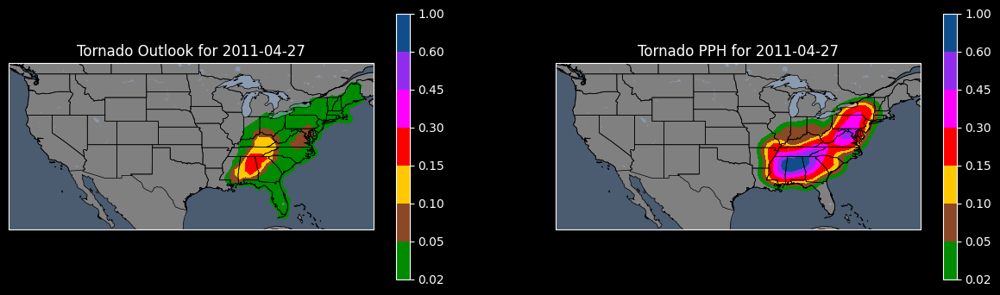

<Figure size 640x480 with 0 Axes>

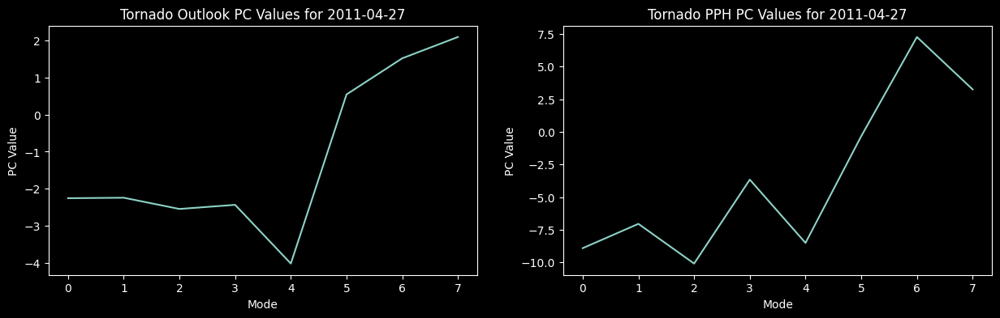

Day Maximixing Outlooks PC 0, 2012-04-14T12:00:00


<Figure size 640x480 with 0 Axes>

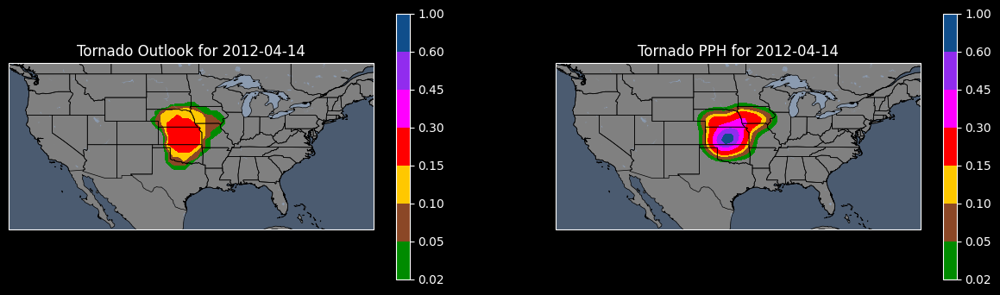

<Figure size 640x480 with 0 Axes>

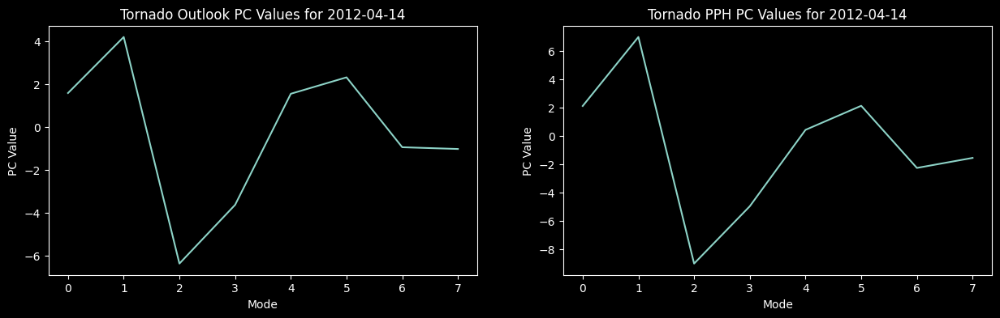

Day Minimizing Outlooks PC 0, 2004-05-30T12:00:00


<Figure size 640x480 with 0 Axes>

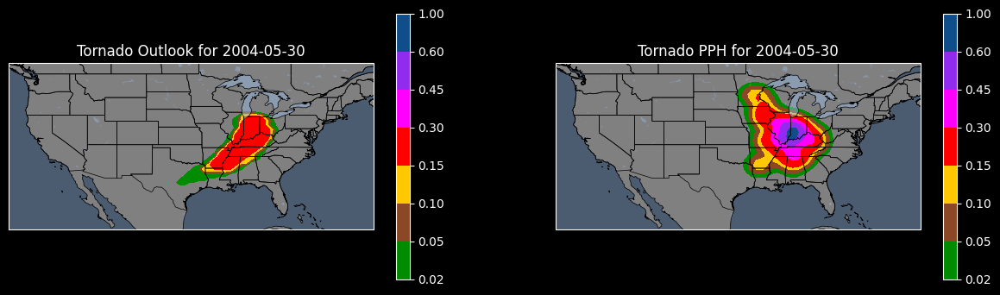

<Figure size 640x480 with 0 Axes>

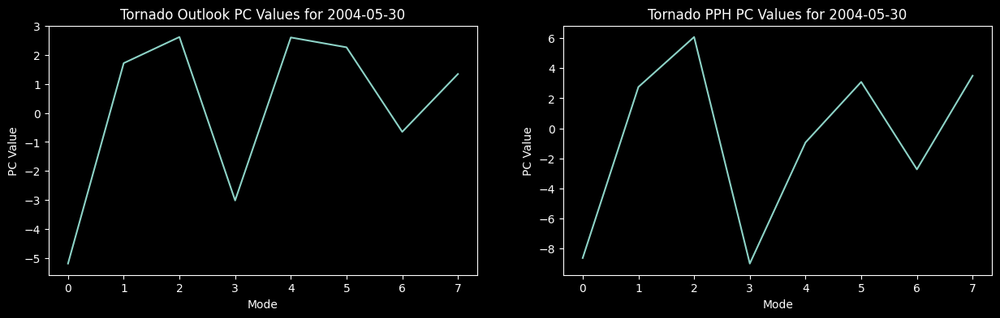

Day Maximixing Outlooks PC 1, 2006-03-12T12:00:00


<Figure size 640x480 with 0 Axes>

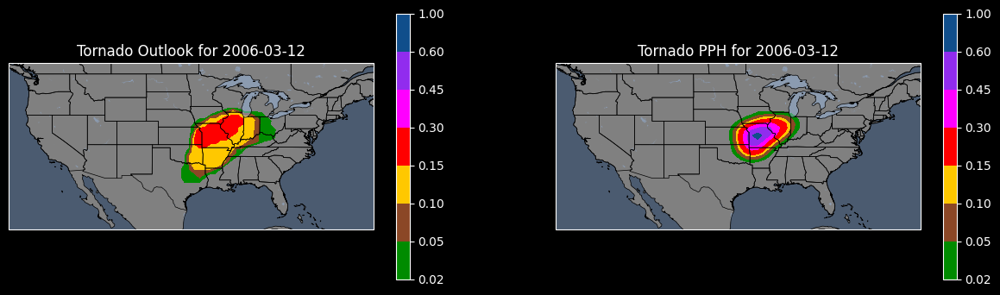

<Figure size 640x480 with 0 Axes>

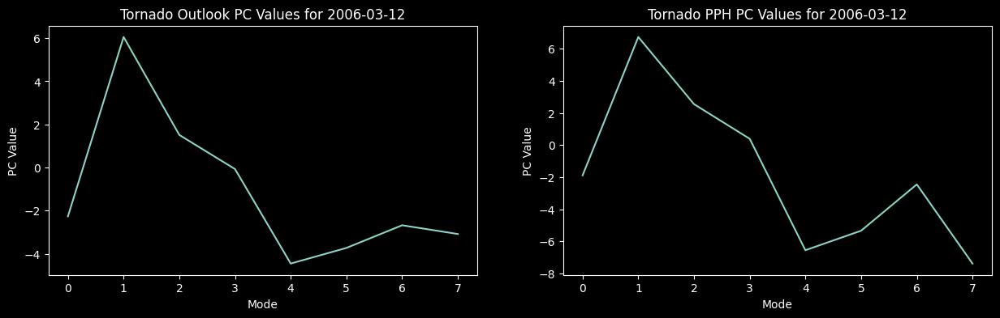

Day Minimizing Outlooks PC 1, 2002-11-10T12:00:00


<Figure size 640x480 with 0 Axes>

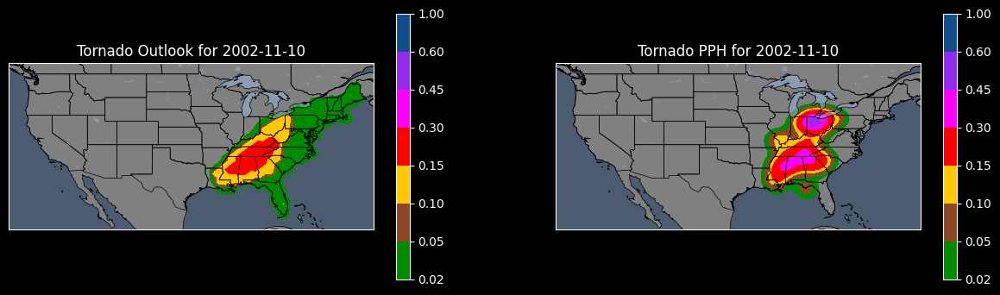

<Figure size 640x480 with 0 Axes>

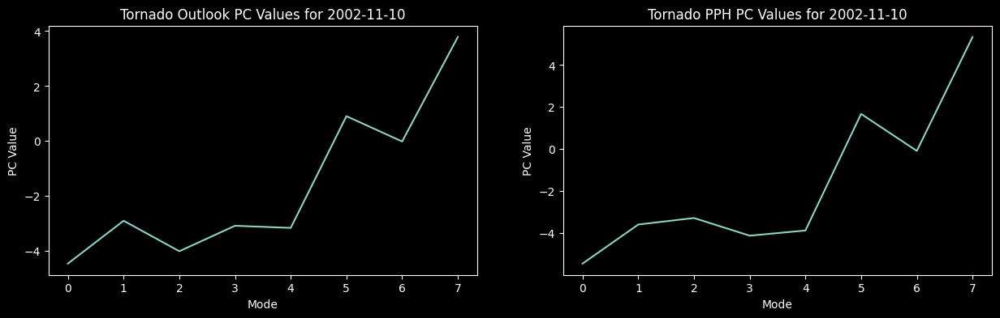

Day Maximixing Outlooks PC 2, 2003-05-10T12:00:00


<Figure size 640x480 with 0 Axes>

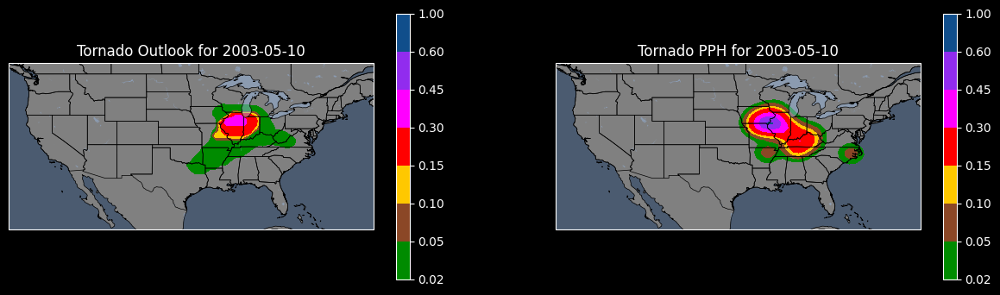

<Figure size 640x480 with 0 Axes>

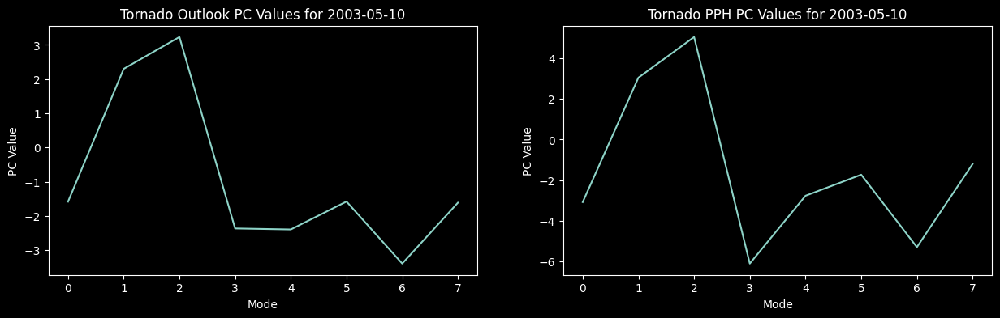

Day Minimizing Outlooks PC 2, 2012-04-14T12:00:00


<Figure size 640x480 with 0 Axes>

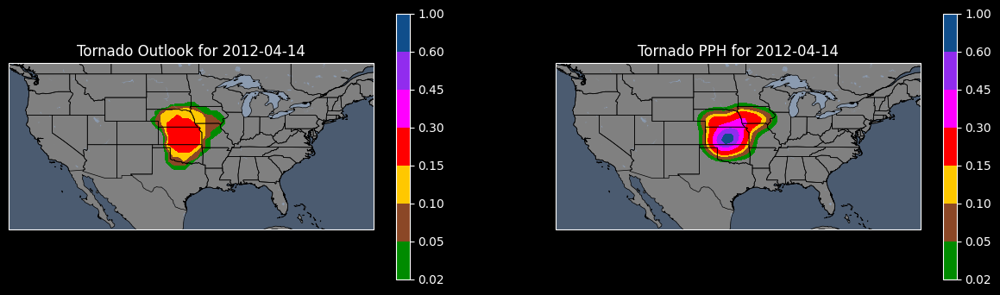

<Figure size 640x480 with 0 Axes>

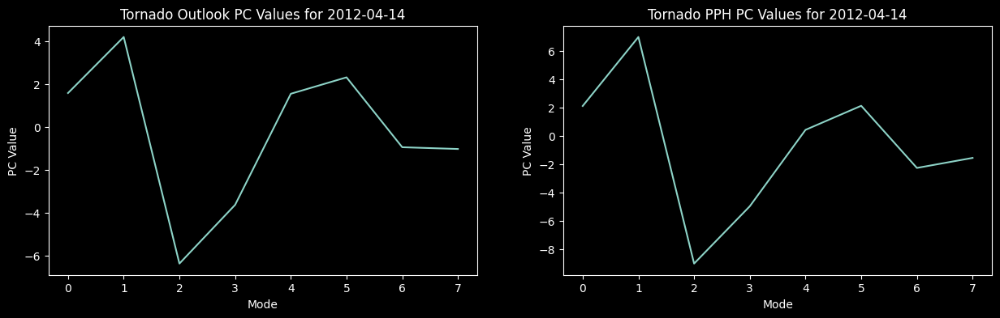

Day Maximixing Outlooks PC 3, 2009-02-10T12:00:00


<Figure size 640x480 with 0 Axes>

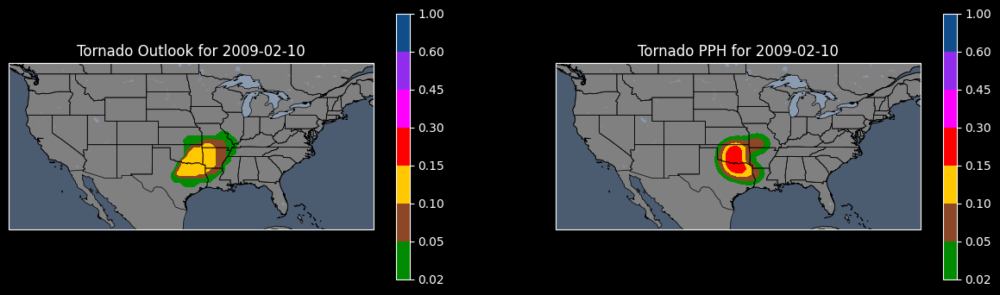

<Figure size 640x480 with 0 Axes>

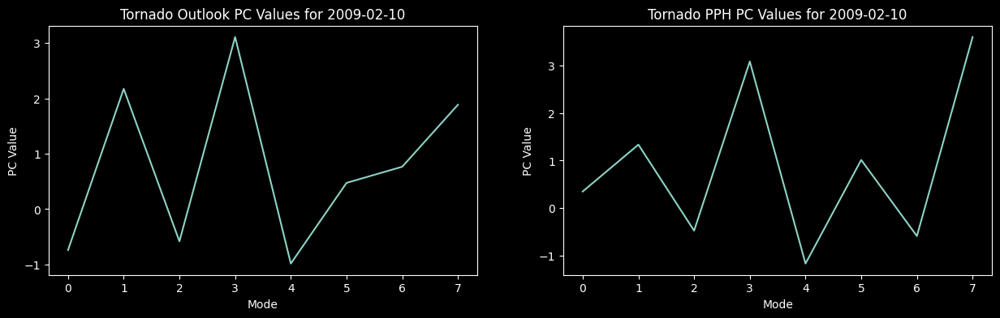

Day Minimizing Outlooks PC 3, 2012-04-14T12:00:00


<Figure size 640x480 with 0 Axes>

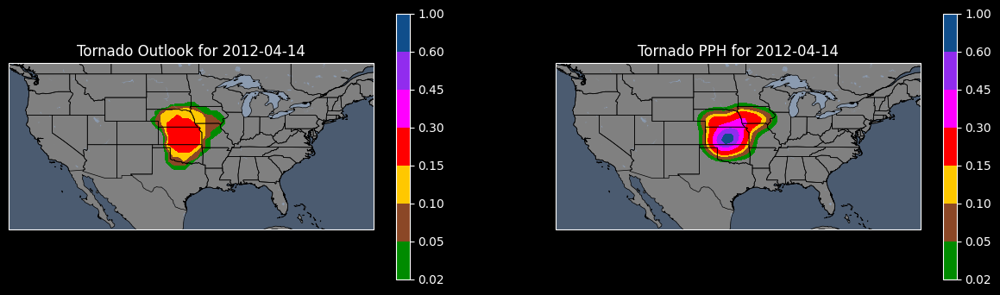

<Figure size 640x480 with 0 Axes>

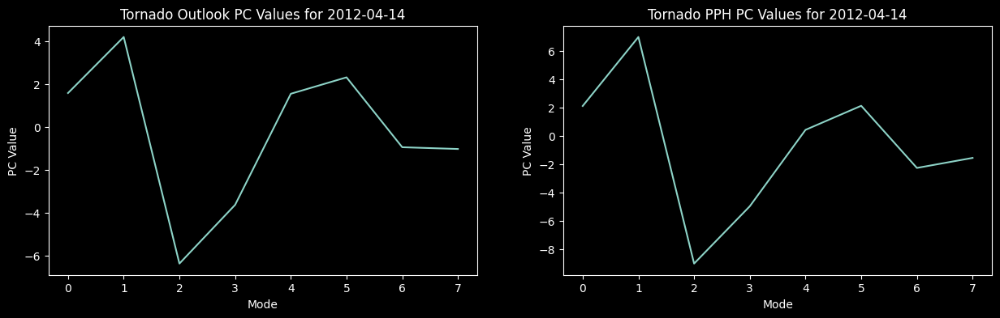

Day Maximixing Outlooks PC 4, 2008-02-05T12:00:00


<Figure size 640x480 with 0 Axes>

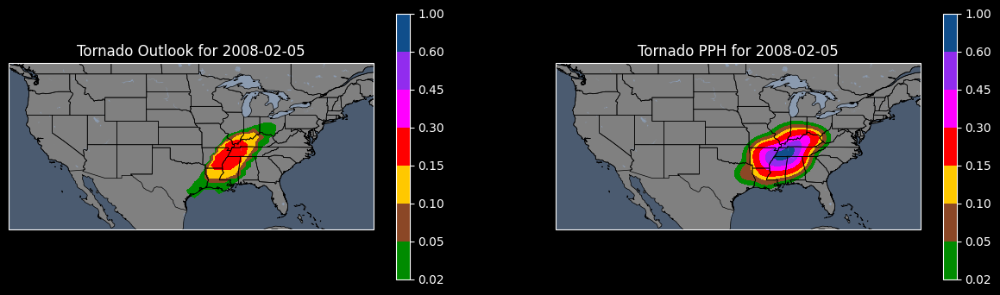

<Figure size 640x480 with 0 Axes>

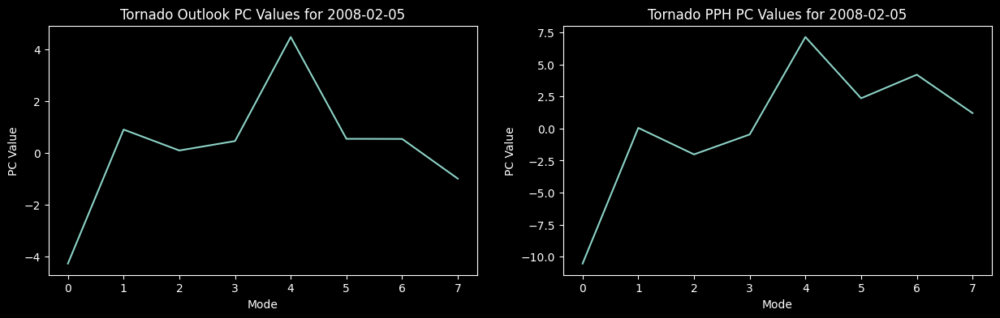

Day Minimizing Outlooks PC 4, 2006-03-12T12:00:00


<Figure size 640x480 with 0 Axes>

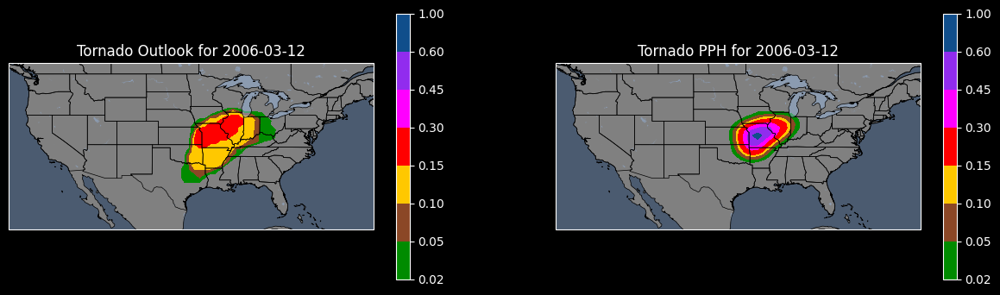

<Figure size 640x480 with 0 Axes>

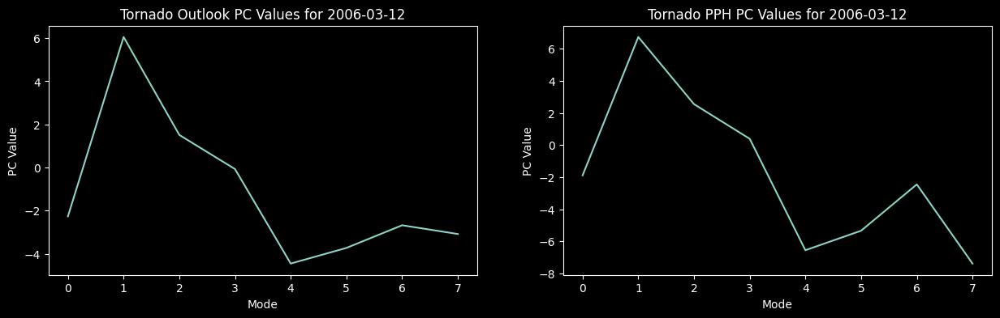

Day Maximixing Outlooks PC 5, 2003-05-15T12:00:00


<Figure size 640x480 with 0 Axes>

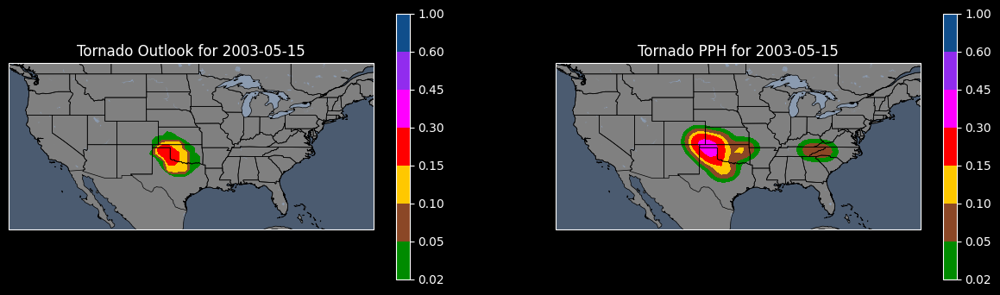

<Figure size 640x480 with 0 Axes>

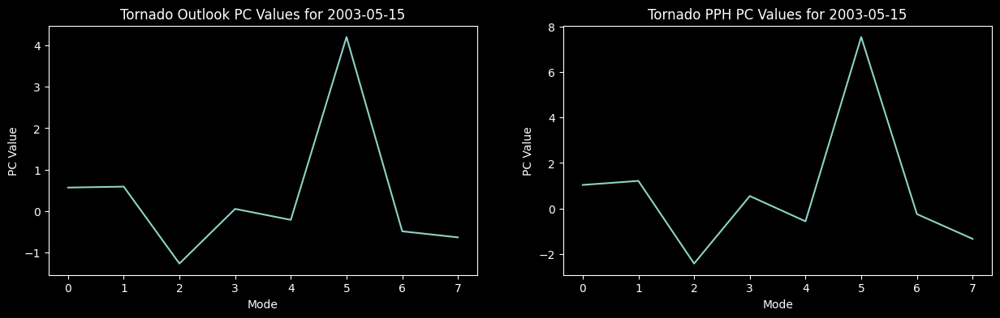

Day Minimizing Outlooks PC 5, 2006-03-12T12:00:00


<Figure size 640x480 with 0 Axes>

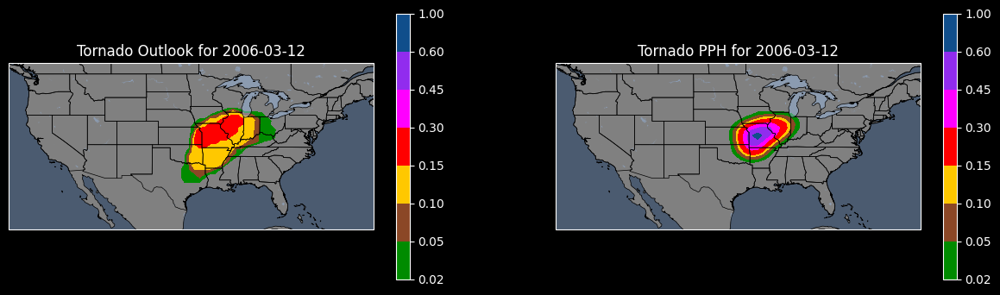

<Figure size 640x480 with 0 Axes>

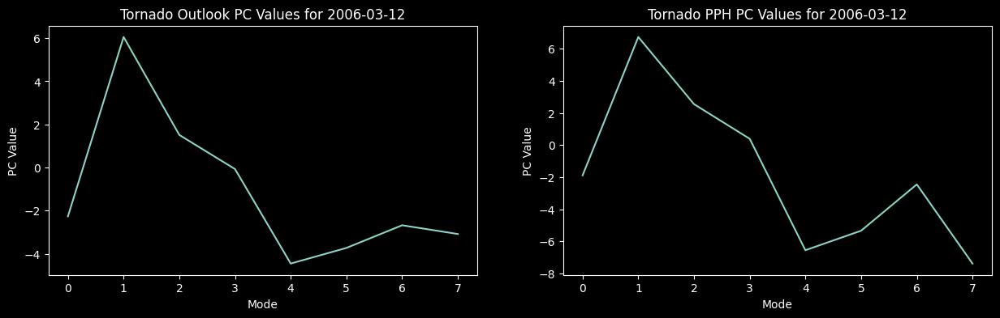

Day Maximixing Outlooks PC 6, 2003-05-04T12:00:00


<Figure size 640x480 with 0 Axes>

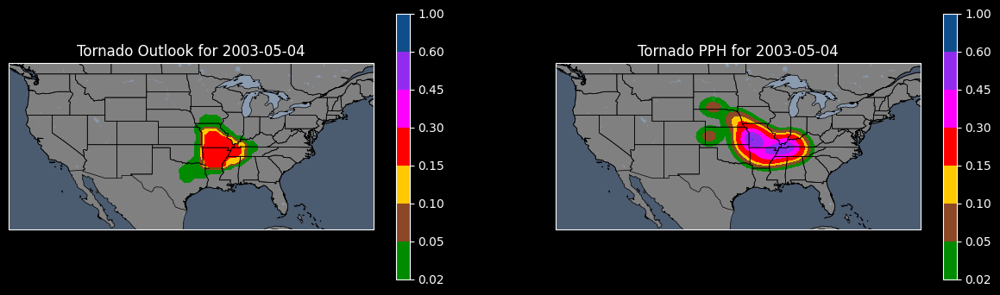

<Figure size 640x480 with 0 Axes>

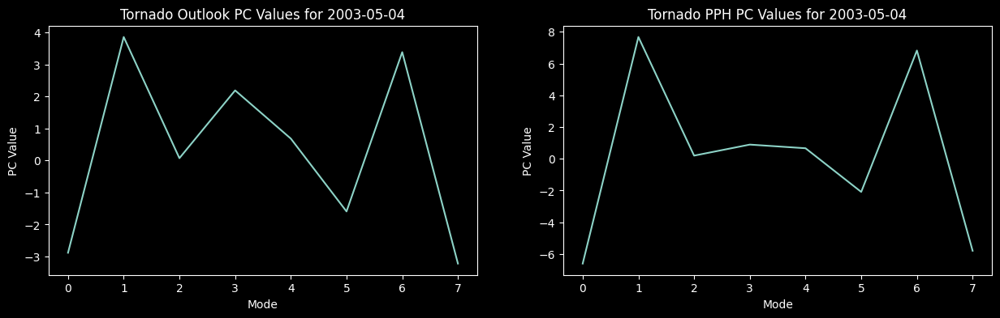

Day Minimizing Outlooks PC 6, 2002-12-23T12:00:00


<Figure size 640x480 with 0 Axes>

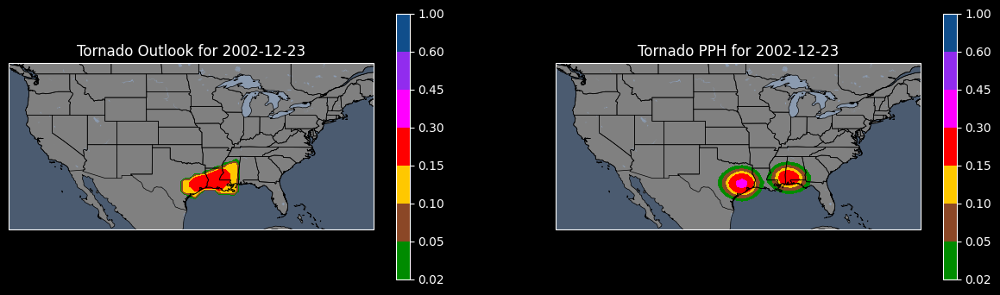

<Figure size 640x480 with 0 Axes>

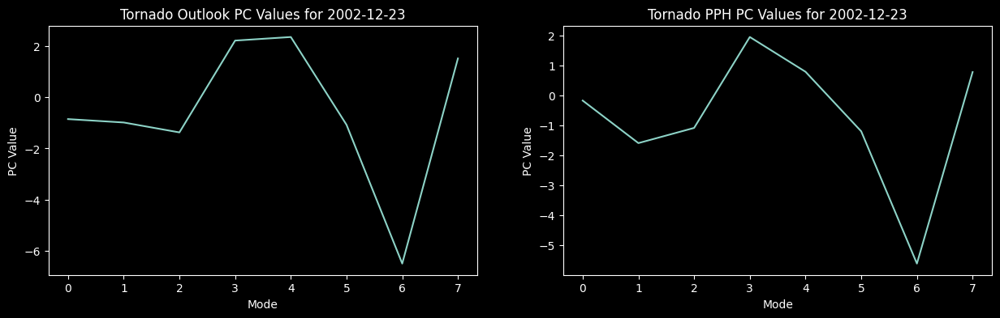

Day Maximixing Outlooks PC 7, 2002-11-10T12:00:00


<Figure size 640x480 with 0 Axes>

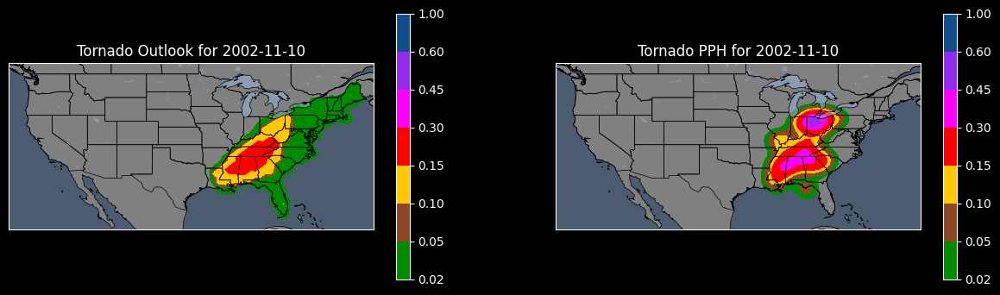

<Figure size 640x480 with 0 Axes>

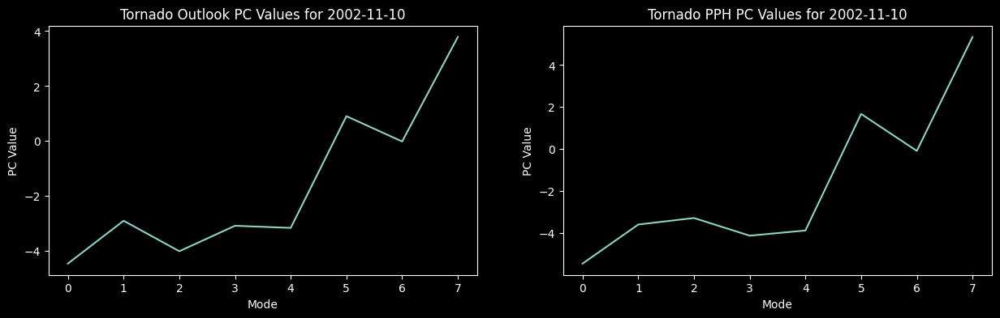

Day Minimizing Outlooks PC 7, 2003-05-04T12:00:00


<Figure size 640x480 with 0 Axes>

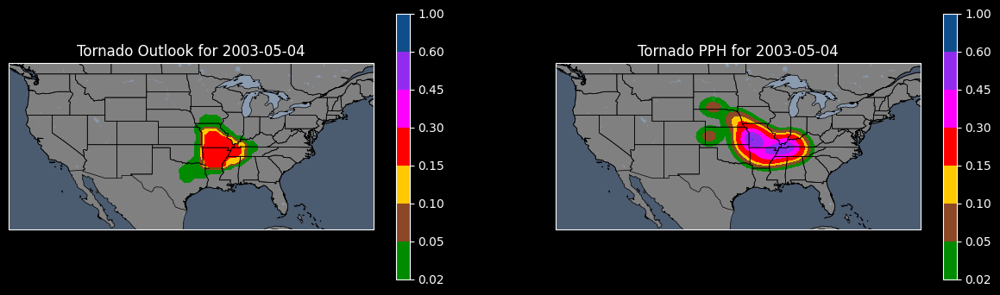

<Figure size 640x480 with 0 Axes>

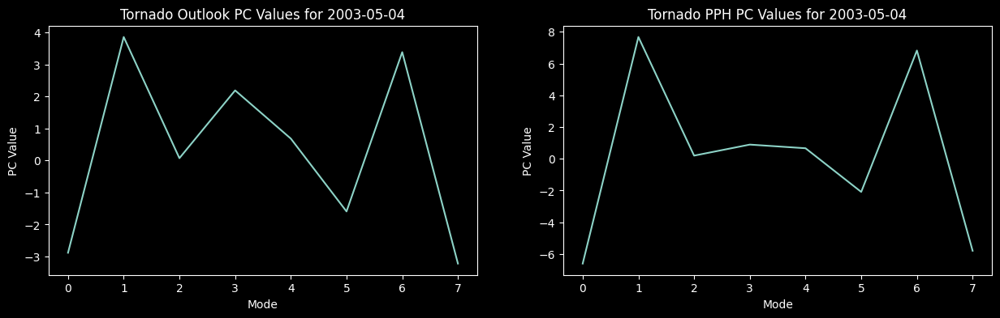

C:\Users\miles\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\miles\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


<Figure size 640x480 with 0 Axes>

In [6]:
output_folder = 'mca_plots/'

nmodes = 8
variance_nmodes = 20
pc_nmodes = 8


for hazard, i in zip(hazards, range(len(hazards))):

    date_investigate = '2011-04-27T12:00:00'
    
    if hazard == 'hail':
        hazardstring = 'Hail'
    elif hazard == 'wind':
        hazardstring = 'Wind'
    else:
        hazardstring = 'Tornado'

    output_location = output_folder + hazard + '/'

    mca = xMCA(outlook_dataset_renamed['p_'+hazard], pph_renamed['p_perfect_'+hazard])
    mca.solve()
    svals = mca.singular_values()
    expvar = mca.explained_variance()
    eofs  = mca.eofs()
    pcs = mca.pcs()

    analyze_mca(expvar, eofs, pcs, variance_nmodes, hazardstring, nmodes, pph, date_investigate, outlook_dataset_renamed, pph_renamed, pc_nmodes, hazard)   

In [11]:
#takeaways: 
#pph generally match outlooks well, as similar in each direction. PPH seem to have higher magnitudes, matching existing critiques of pph.
#some kind of archetypes of storms. i.e. can differentite between plains and south from tornado mode zero. Vaguely make sense
#archetypes differ between hazard modes. seems to make sense. i.e. hail more reperesented in plains, wind more represented in NE
#can see orthogonality in eofs, makes sense. However, idea of orthogonality in this application may not have much physical meaning.
#Where left and right eofs differ, outlooks and pph differ. Perhaps suggesting outlooks in certain areas should be shifted a little?
#tornado eof 0 is unimodal rather than bimodal, so makes sense pc only large in one direction. Some eofs multimodal too
